# Ejemplo y explicación de redes GAN -Generative Adversarial Networks-

### Jerónimo Molina Molina, noviembre de 2020

**El código de este notebook está basado en un ejemplo del libro Python Deep Learning Introducción práctica con Keras y TensorFlow 2**, del profesor Jordi Torres.

### Introducción a las GAN

#### Las GAN son pares de redes neuronales que compiten entre sí para alcanzar un objetivo de generación de contenido, tal que, una, la generadora, precisamente se encarga de generar (imágenes vídeo, texto audio,...lo que sea) a partir de, incialmente, datos aleatorios, mientras que la otra, la discriminadora, analiza la información generada por la primera y decide si es un dato real o falso apoyándose en datos reales.

#### Se trata de dos redes que aprenden a la par y compiten entre sí, "jugando al gato y al ratón". El juego termina cuando la discriminadora no es capaz de distinguir entre los datos reales y los generados por la generadora. En ese momento, y si convergen de forma paralela (una no aprende mucho más rápido que la otra), la red generadora, si tiene un buen diseño, estará generando una salida lo suficientemente buena como para que no se distinga de la realidad (al menos según la red discriminadora).

#### Si ambas reden neuronales tienen una arquitectura suficientemente buena, se pueden conseguir grandes resultados.

#### En este notebook no nos vamos a centrar en crear una arquitectura de redes elaborada, sino en generar un modelo de GAN que permita explicar los conceptos subyacentes

#### La imagen siguiente, extraída de la página web del profesor Jordi Torres https://torres.ai/generative-adversarial-networks/, explica, de forma muy clara, cómo se coordinan las redes generadora y discriminadora.

![Esquema básico de una GAN](https://torres.ai/wp-content/uploads/2019/09/Generative-Adversarial-Networks-GAN-Keras-TensorFlow-Jordi-Torres-3.png)

#### La red discriminadora devolverá un dato entre 0 y 1, donde 0 significa que data generada es absolutamente fake mientras que si devuelve un 1 nos está diciendo que la imagen según la red discriminadora no es fake -tengamos en cuenta que la discriminadora "no sabe" si es fake o no, simplemente tiene una entrada y debe decidir si es fake o no lo es basándose en datos que si son reales-. A partir de este dato, generaremos una función "loss" para la discriminadora y una función "loss" para la generadora. Lo interesante es que, mientras que eun una CNN u otros tipos de red neuronal la función "loss" debe minimizarse, en la generadora debemos maximizarla, ya que pretendemos "engañar" a la discriminadora.

#### En este ejemplo vamos a tomar como datos "reales" el conjunto "fashion mnist" y, a partir de un "ruido" o datos aleatorios iniciales, nuestro generador, alimentado por la loss calculada a partir del discriminador, va a ir depurando sus habilidades (aprendiendo a generar imágenes de prendas de vestir) poro a poco.

#### En la medida en que tengamos una red generadora suficientemente buena (que debe ir a la par que la discriminadora en calidad de arquitectura) las imágenes generadas al final del entrenamiento serán mejores o peores, pero insisto, en nuestro caso trabajamos un ejemplo para ocmprender cómo funcionan los modelos GAN, no para obtener imágenes de gran calidad, quedará como ejercicio para el lector, precisamente, mejorar la arquitectura del generador y del discriminador para obtener imágenes de mayor calidad.

#### **NOTA:**  Dado el coste computacional de este notebook, se recomienda encarecidamente al lector que lo ejecute en google collab, seleccionando GPU o TPU, para acelerar el proceso de entrenamiento.

#### En primer lugar vamos a seleccionar la versión 2 de TensorFlow

In [2]:
%tensorflow_version 2.x
import tensorflow as tf
from tensorflow import keras
print(tf.__version__)

TensorFlow 2.x selected.
2.1.0-rc1


In [3]:
# En el caso de haber seleccionado GPU, mediante la siguiente instrucción podremos ver el procesador gráfico asignado
!nvidia-smi

Mon Jan  6 20:32:16 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.44       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os

### Preparación de nuestros datos de entrenamiento para el discriminador

#### En el siguiente bloque de código importamos las imágenes del conjunto fashion mnist (solo nos interesan las imágenes de entrenamiento, ya que es para enviarle al discriminador datos verdaderos con los que pueda comparar los generados, se escalan (convertimos los bits a valores entre 0 y 1) y se organiza el dataset en lotes de 256 imágenes, para trabajar en lotes

In [0]:

#(train_images, _), (_, _) = tf.keras.datasets.mnist.load_data()
#(X_train, y_train), (X_test, y_test) = tf.keras.datasets.fashion_mnist.load_data()
(train_images, _), (_, _) = tf.keras.datasets.fashion_mnist.load_data()

train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')

train_images = (train_images - 127.5) / 127.5 

BUFFER_SIZE = 60000
BATCH_SIZE = 256
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

### Diseño de los modelos generador y discriminador

#### **Generador**

##### Como hemos explicado, nuestro generador va a crear las imágenes a partir de ruido, y simplemente va a aprender cómo generar imágenes válidad alimentándose de una fución "loss" que se basa en la salida del discriminador,.... es como si el discriminador le fuese diciendo "vas bien" o "vas mal",... por eso es importante que las arquitecturas de red de nuestros modelos estén equilibradas en cuanto a calidad de diseño. Un discriminador muy bueno frente a un generador pésimo, o viceversa, tendría un mal resultado.

In [0]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Reshape, Conv2DTranspose, BatchNormalization, LeakyReLU

# * La capa Conv2DTranspose realiza una transformación en dirección opuesta a una convolución normal, es decir,
# permite ampliar la imagen en lugar de reducirla. Puedes encontras más informacióin al respecto de esta capa en la página web 
# de documentación de la API de keras.
# * La capa BatchNormalization realiza una normalización -escalado- de los datos
# LeakyRelu, similar a la función de activación relu pero evita los valores 0 asignando en su lugar valores muy próximos a '0'
# * No es propósito de este notebook enseñar todo el detalle de cada capa y su funcionamiento, esta tarea puede realizarla el 
# lector buscando información en google o directamente en la API de Keras.

# Nuestro modelo, finalmente, genera imágenes de 28x28x1 (28x28 en escala de grises), es decir, del mismo tamaño que las 
# imágenes de fashion_mnist, de modo que sean comparables.

def make_generator_model():
    model = Sequential()
    model.add(Dense(7*7*256, use_bias=False, input_shape=(100,))) # La entrada es un verctor [1,100] pixels en escala de gris

    model.add(Reshape((7, 7, 256))) 

    model.add(Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2DTranspose(64, (5, 5), strides=(1, 1), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', activation='tanh'))

    return model



In [7]:
generator = make_generator_model()
generator.summary ()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 12544)             1254400   
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 14, 14, 128)       819328    
_________________________________________________________________
batch_normalization (BatchNo (None, 14, 14, 128)       512       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 14, 14, 128)       0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 14, 14, 64)        204864    
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 64)        2

#### Vamos a comprobar a continuación, generando un vector de ruido y pasándoselo al modelo, cómo el modelo genera una imagen 28x28x1 de ruido, es decir, comprobamos que nuestro generador hace lo que tiene que hacer.

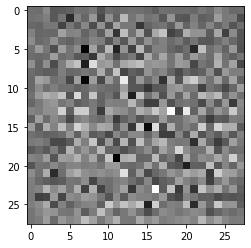

In [8]:
noise_dim = 100
noise = tf.random.normal([1, noise_dim])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')


#### **Discriminador**

##### Nuestro discriminador va a recibir una imagen de entrada, en formato 28x28x1 y, aplicando diferentes capas convolucionales, de normalización, etc... terminará generanco una salida -función de activación- sigmoide. El Discriminador se usa para clasificar las imágenes generadas como reales o fake, generando valores próximos al 1 para imágenes que considera reales y próximos a 0 para imágenes que considera fake. Recordemos que el discriminador "aprenderá" a partir de la función "loss" que le aplicaremos, por lo que, de momento, nos vale con que genere un número entre 0 y 1, y será la función de pérdida la que orientará a nuestra red discriminadora para que aprenda a decidir si la imagen es fake o true (0 - 1).

In [0]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, LeakyReLU, Conv2D

def make_discriminator_model():
    model = Sequential()
    model.add(Conv2D(32, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(LeakyReLU(alpha=0.01))
    
    model.add(Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))
    
    model.add(Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(BatchNormalization())
    model.add(LeakyReLU(alpha=0.01))

    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model



#### Vamos a comprobar a continuación, cómo a partir de la imagen de ejemplo generada arriba, nuestro discriminador genera un valor entre 0 y 1, obviamente no está entrenado, por lo que el valor de salida será absolutsamente aleatorio. Vamos a mostrar también la arquitectura del discriminador.

In [10]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

discriminator.summary ()

tf.Tensor([[0.5006715]], shape=(1, 1), dtype=float32)
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 14, 14, 32)        832       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 7, 7, 64)          51264     
_________________________________________________________________
batch_normalization_2 (Batch (None, 7, 7, 64)          256       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 128)         204928    
_________________________________________________________________


### Funciones de *Loss* y optimizadores

#### ....y por fin llegamos a la clave de nuestra GAN, ahora vamos a diseñar las funciones loss. Emplearemos, sin complicarnos en ello, el optim,izador Adam en ambos modelos, ya que habitualmente se emplea éste en redes GAN debido a que tiene un funcionamiento muy bueno en estos diseños.

#### como función de pérdida vamos a emplear BinaryCrossEntropy, debido a que como hay que decidir entre si es fake o true -discriminador- y si va bien el generador o no, ambas decisiones son binarias. La función CrosssEntropy nos va a permitir medir de forma adecuada la distancia entre la prediccion que debería haber hecho el discriminador y la hecha realmente para lotes de imágenes reales y generadas. En concreto, binary cross entropy nos aporta una medida de la diferencia entre las probabilidades calculadas y las probabilidades reales de predicciones en los casos donde solo hay dos clases posibles en las que pueden ser clasificados los datos de entrada. 


In [0]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### discriminator_loss

#### Debemos cuantificar cómo de bien  el Discriminador consigue distinguir imágenes reales de imágenes fake en una interación (para una imagen real y una imagen fake). 

#### Por ello, el método recibe en el primer argumento (real_output) la predicción que ha hecho el Discriminador de un batch de imagenes reales y en el segundo argumento (fake_output) la predicción que ha hecho de un batch de imágenes fake.

#### Obviamente, si la predicción fuera la correcta, para una imagen real la predicción debería de ser 1 y para una imagen fake debería de ser 0. Por ello este método compara el batch de imágenes reales predecidas por el Discriminador con un array de unos (tf.ones_like(real_output)) y el batch de imágenes fake con un arrayde ceros (tf.zeros_like(real_output)). La Loss para esta iteración está compuesta tanto por los errores de predicción de imágenes reales como los errores de las imágenes fake.

#### A continuación se muestra el código:

In [0]:
def discriminator_loss(real_output, fake_output):
    # en real_loss se mide el error entre los unos (reales) y el resultado de la clasificación de una imagen real
    real_loss = cross_entropy(tf.ones_like(real_output), real_output) 
    
    # en fake_loss se mide el error entre los ceros (datos fake) y el resultado de la clasificación de una imagen generada
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    
    # en total_loss sumamos los dos errores y devolvemos el resultado.
    total_loss = real_loss + fake_loss
    return total_loss

####  generator_loss

#### Éste es algo más sencillo, aunque sigue con el mismo esquema que el anterior. 

#### En este caso la función de pérdida del generador deberá cuantificar en qué medida ha sido capaz de "engañar" al Discriminador. Por ello, si el Generador funciona bien, el Discriminador clasificará las imágenes fake como reales (es decir, como 1). Aquí, compararemos las decisiones del Discriminador sobre las imágenes generadas por el Generador con una matriz de 1s.

#### De este modo, si nos ha devuelto 1 el discriminador, la función crosss_entropy va a darnos una distancia de 0, lo cual significa que con pérdida 0 hemos generado una imagen con la cual hemos engañado al discriminador, que es nuestro objetivo.

In [0]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

#### Optimizadores. Como he comentado antes, vamos a emplear optimizadores Adam en ambos casos

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)

discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### Entrenamiento

#### En este caso empleamos la API de TensorFlow, ya que Keras no permite -al menos en la fecha de elaboración de este notebook- el entrenamiento de modelos GAN

#### Conviene fijarse en el decorador de la función, etiquetamos nuestra función como "tf.function" para que TensorFlow la optimice y, dentro de lo posible, consigamos un entrenamiento algo más "ligero"

#### train_step. Es el método que genera cada epoch del entrenamiento

#### Empleamos GradientTape para ir almacenando y aplicando back propagation de las funciones loss hacia cada una de nuestras redes, de modo que puedan ir "aprendiendo" a hacer mejor su trabajo en cada epoch.


In [0]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim]) # Generamos un vector aleatorio [256 (batch_size), 100]

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True) # Obtenemos resultado de discriminacion con un batch de imágenes true
      fake_output = discriminator(generated_images, training=True) # Obtenemos resultado de discr. con las generadas o fake

      gen_loss = generator_loss(fake_output) # Obtenemos la loss del generador
      disc_loss = discriminator_loss(real_output, fake_output) # Obtenemos la loss del discriminador

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables) # almacenamos la loss del generador
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables) # almacenamos loss del discr.

    # aplicamos las loss a través del optimizador en cada caso
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

### Bucle de entrenamiento: train

####  Nuestro proceso de entrenamiento está definido en la siguiente función, no es complicado, comentarions en el código

In [0]:
import time

grid_size_x= 10
grid_size_y= 10
seed = tf.random.normal([grid_size_x*grid_size_y , noise_dim]) # Generamos una semilla para nuestro generador aleatorio

def train(dataset, epochs): 
  for epoch in range(epochs):
    start = time.time() # medimos el tiempo que consumimos en cada epoch

    for image_batch in dataset: #para cada lote del dataset de entrenamiento - se procesa el dataset entero en cada epoch-
      train_step(image_batch)    # ejecutamos el entrenamiento -epoch-

    generate_images(generator,seed)  # y generamos unas imágenes para mostrar la evolución de la red generadora en cada época
    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  generate_images(generator, seed)

#### Mostramos las imagenes que genera el Generador para ver que va aprendiendo



In [0]:

def generate_images(model, test_input):
  
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(grid_size_x,grid_size_y))
  for i in range(predictions.shape[0]):
      plt.subplot(grid_size_x, grid_size_y, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')            
  plt.show()

### Entrenamiento del modelo GAN

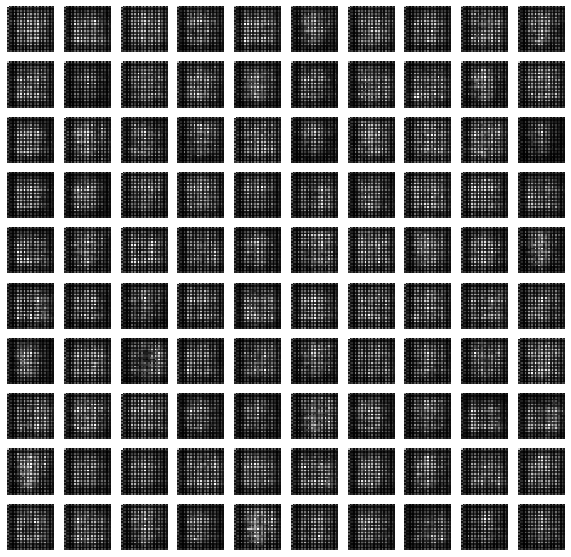

Time for epoch 1 is 12.176724672317505 sec


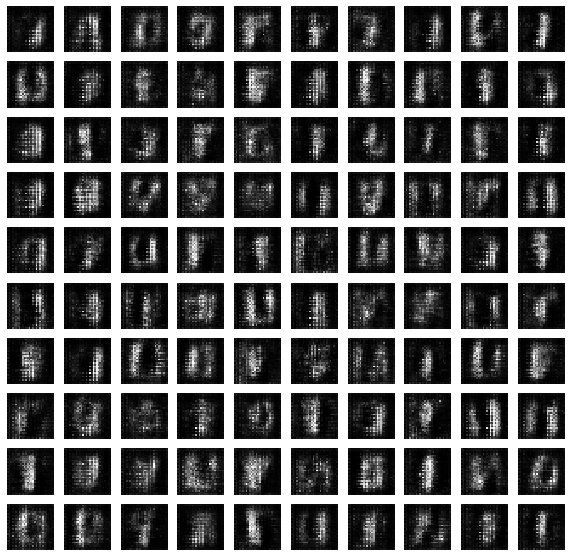

Time for epoch 2 is 9.791322708129883 sec


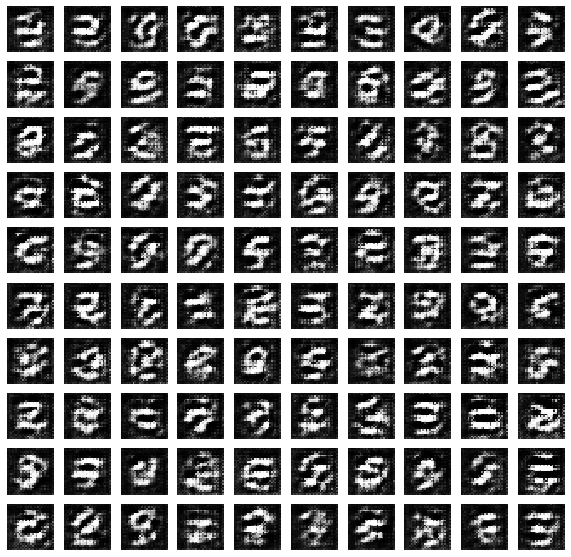

Time for epoch 3 is 9.557947397232056 sec


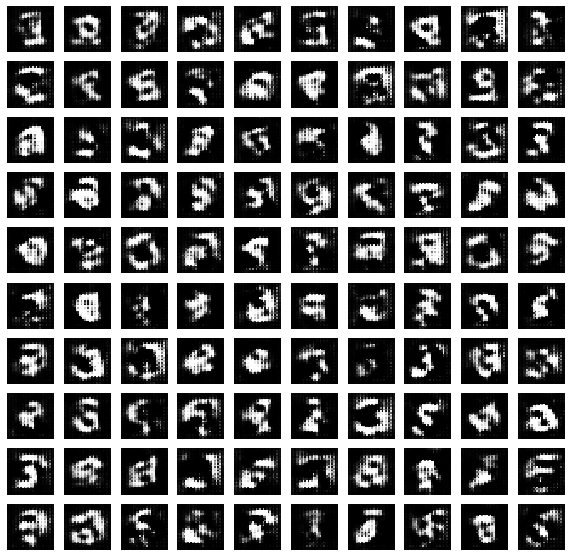

Time for epoch 4 is 9.65592336654663 sec


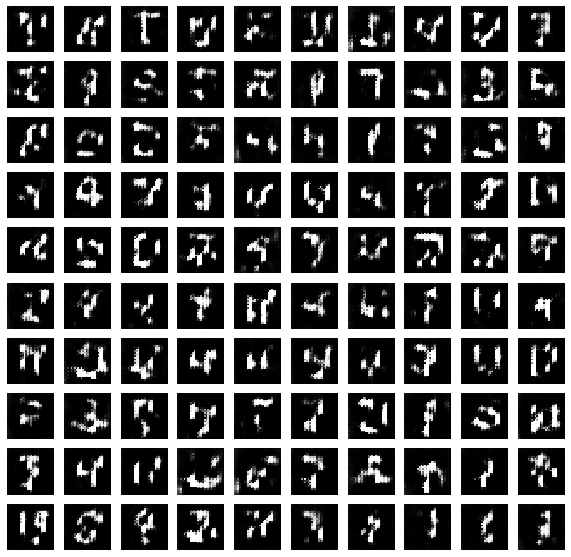

Time for epoch 5 is 9.496528148651123 sec


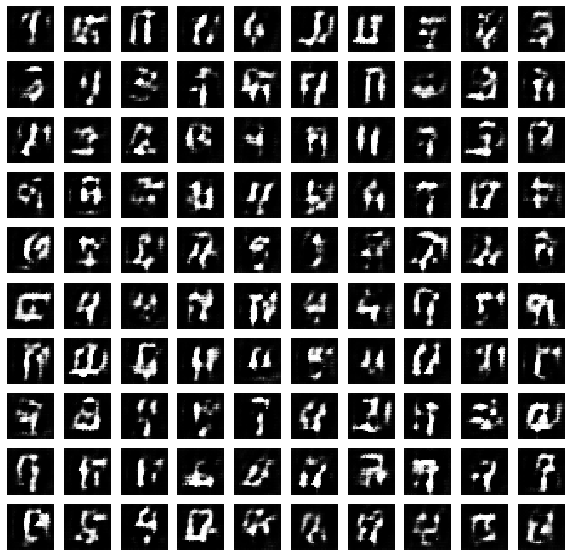

Time for epoch 6 is 9.606858491897583 sec


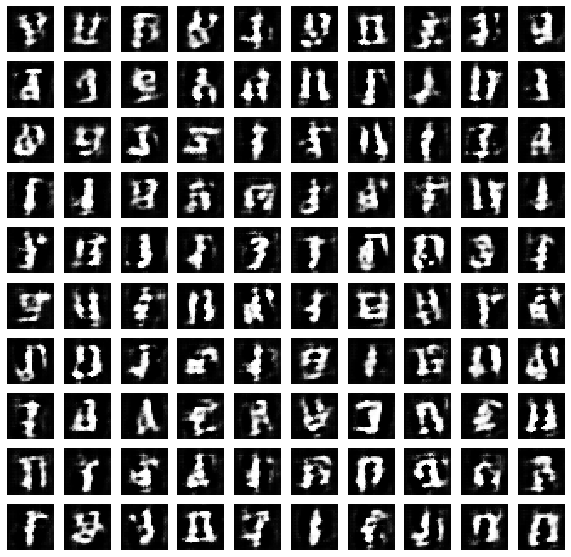

Time for epoch 7 is 9.544742345809937 sec


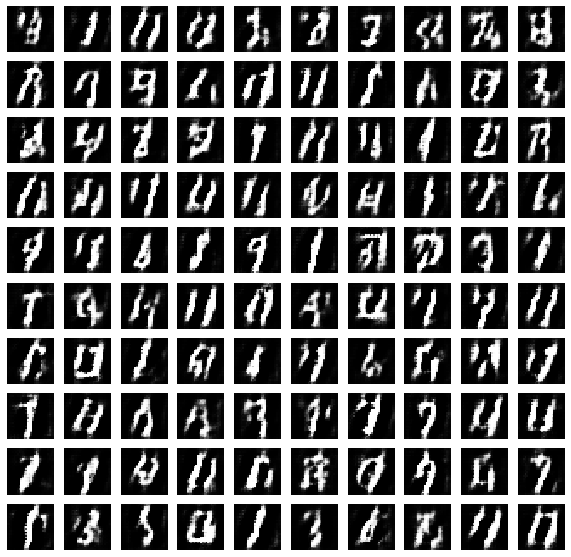

Time for epoch 8 is 9.585448503494263 sec


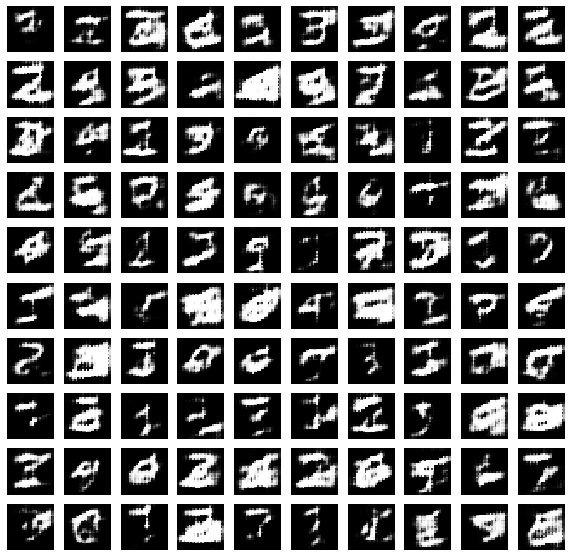

Time for epoch 9 is 9.478255987167358 sec


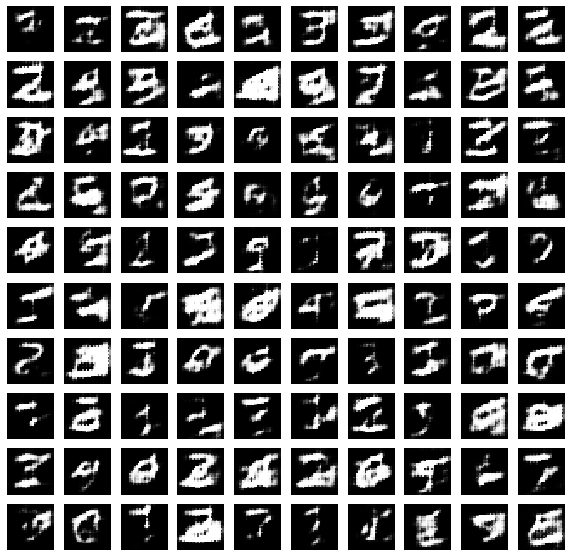

Time for epoch 10 is 9.617586851119995 sec


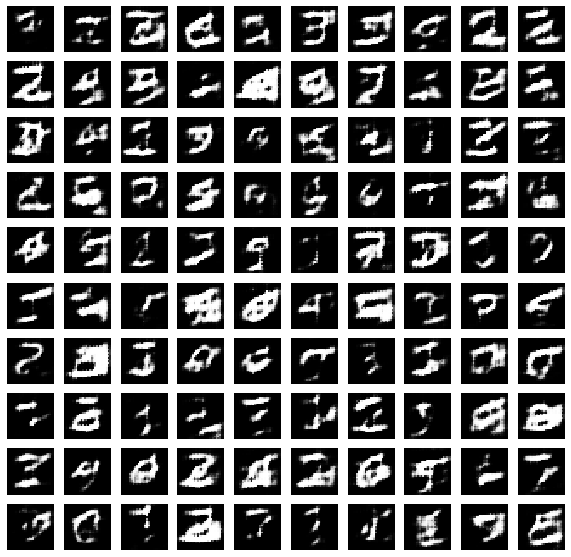

Time for epoch 11 is 9.458784341812134 sec


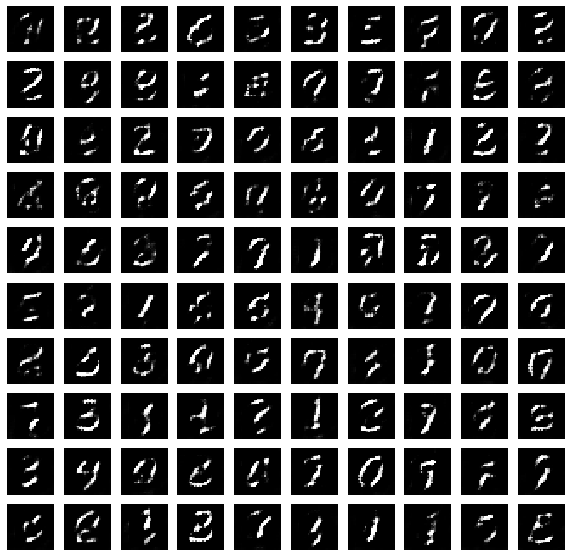

Time for epoch 12 is 9.6087007522583 sec


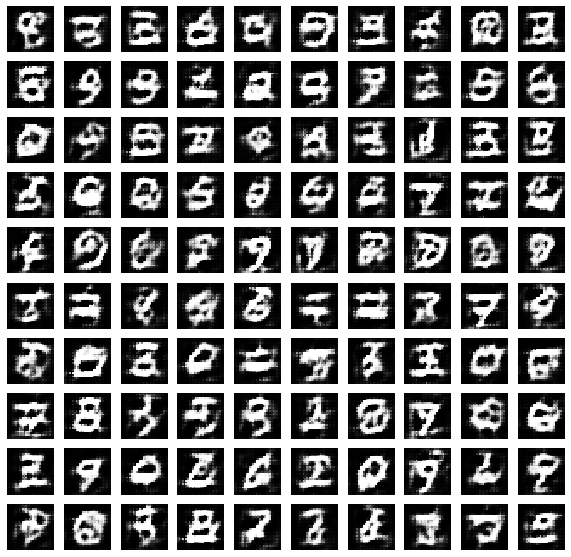

Time for epoch 13 is 9.50096321105957 sec


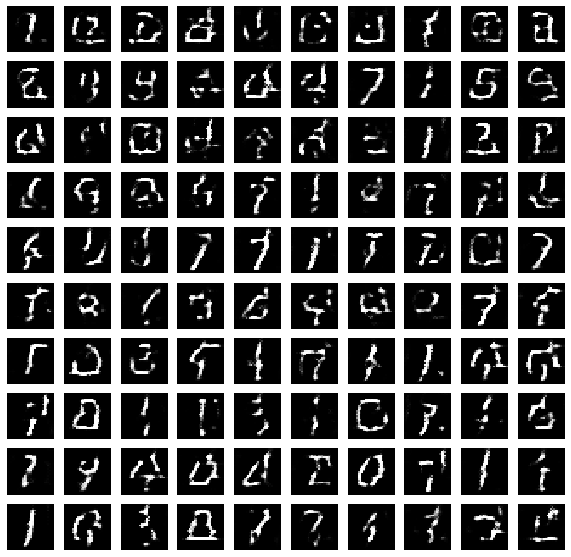

Time for epoch 14 is 9.611658811569214 sec


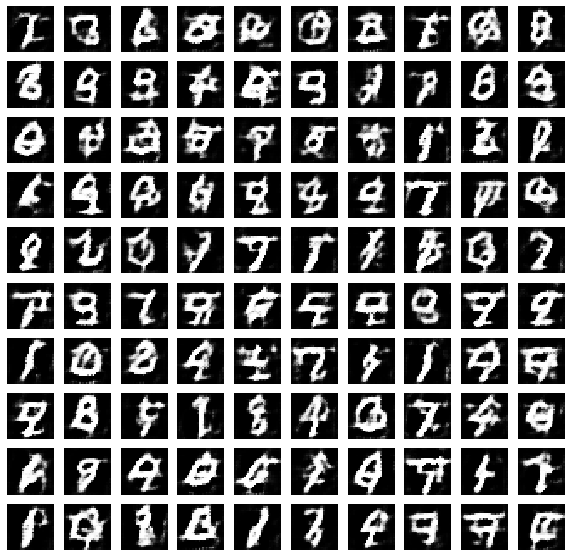

Time for epoch 15 is 9.457929849624634 sec


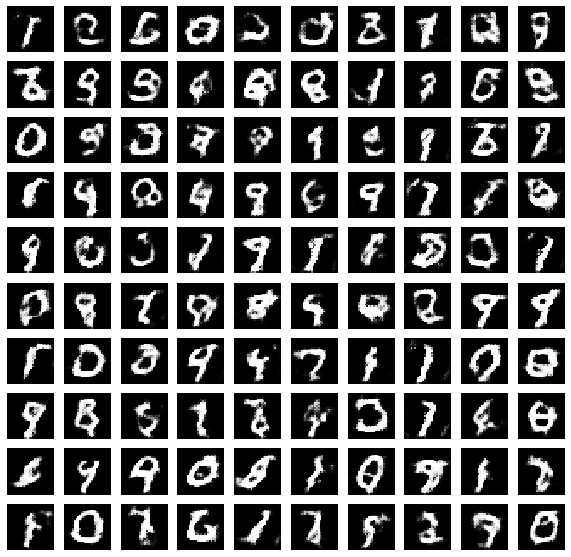

Time for epoch 16 is 9.63055419921875 sec


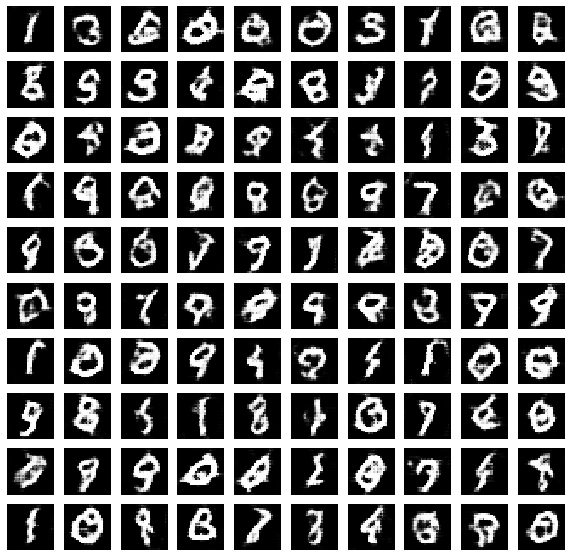

Time for epoch 17 is 9.492754220962524 sec


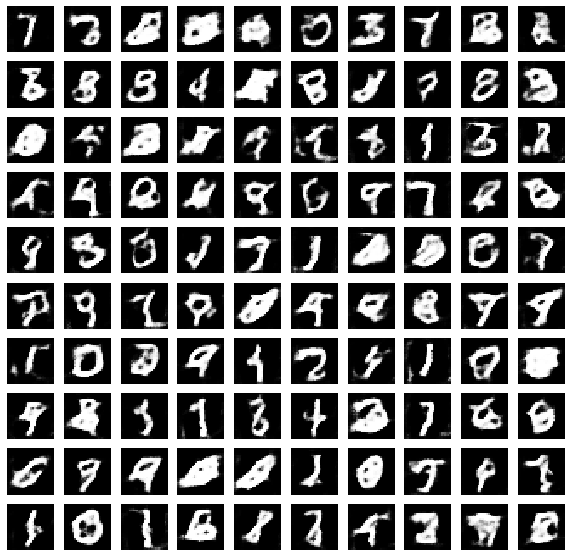

Time for epoch 18 is 9.586399793624878 sec


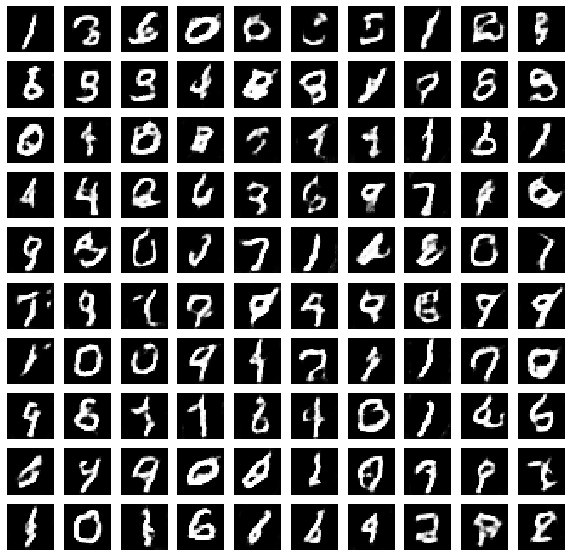

Time for epoch 19 is 9.453077793121338 sec


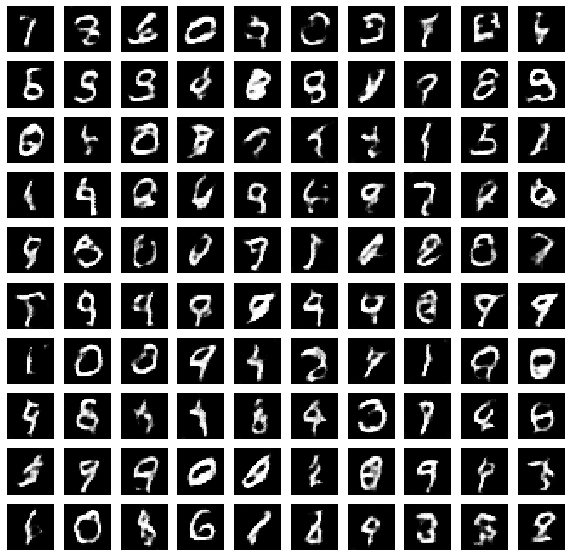

Time for epoch 20 is 9.558231592178345 sec


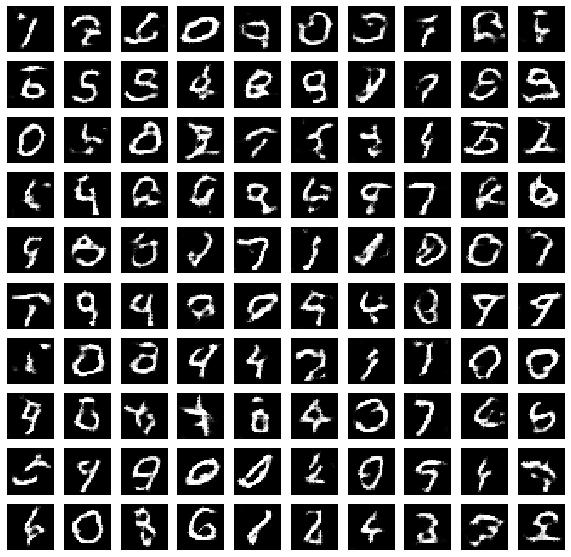

Time for epoch 21 is 9.436607837677002 sec


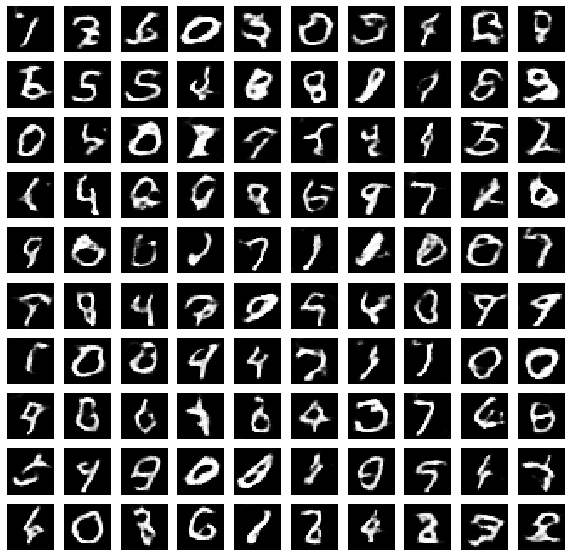

Time for epoch 22 is 9.63064956665039 sec


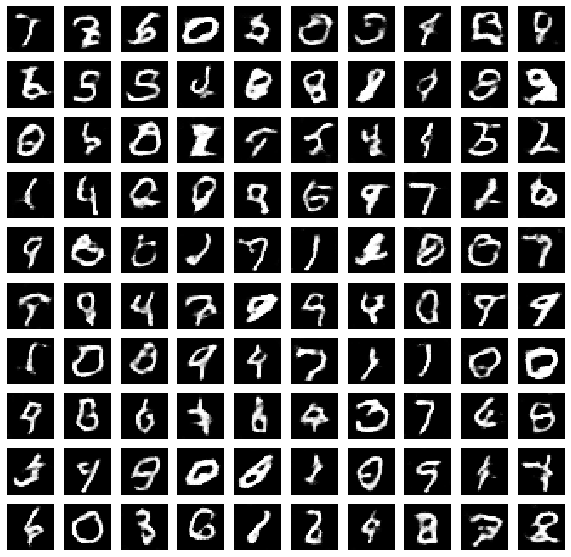

Time for epoch 23 is 9.531471729278564 sec


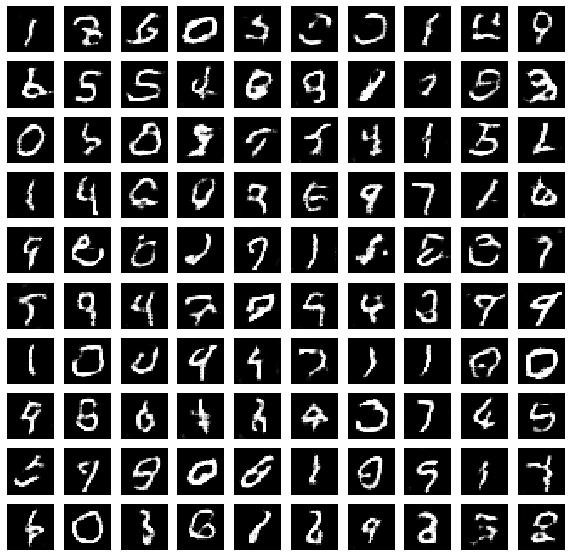

Time for epoch 24 is 9.609479904174805 sec


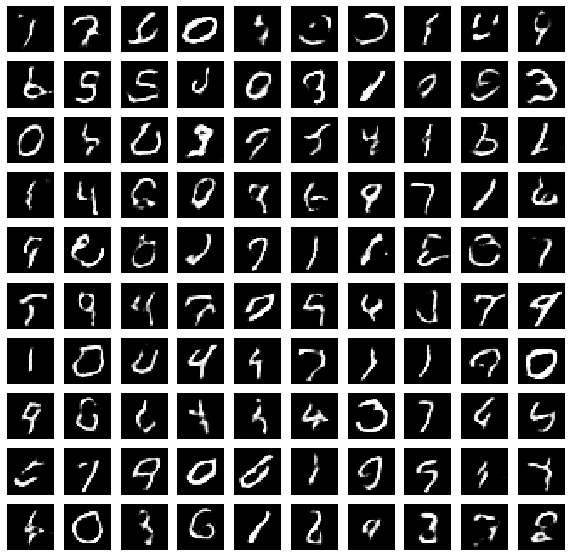

Time for epoch 25 is 9.450984477996826 sec


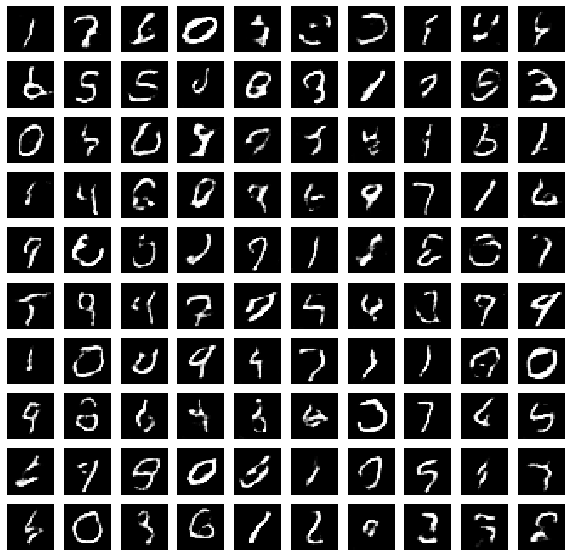

Time for epoch 26 is 9.543636798858643 sec


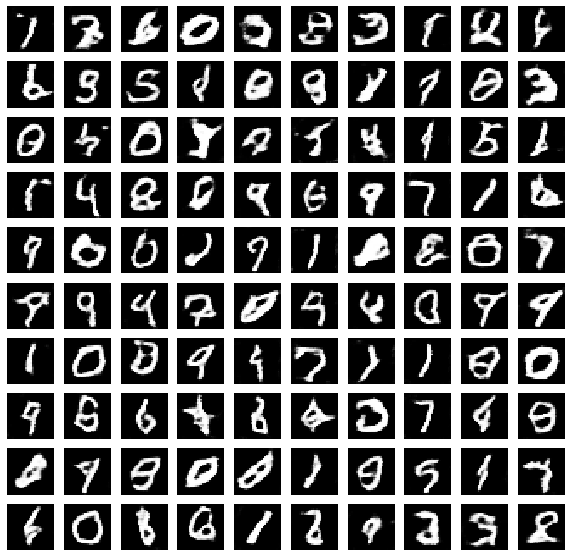

Time for epoch 27 is 9.44303274154663 sec


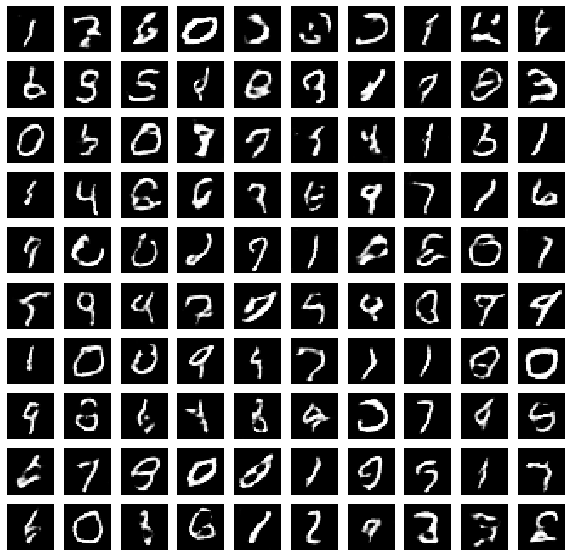

Time for epoch 28 is 9.556426048278809 sec


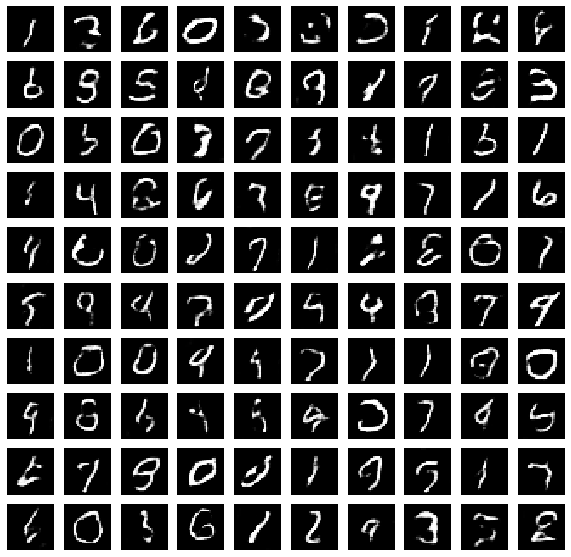

Time for epoch 29 is 9.369872808456421 sec


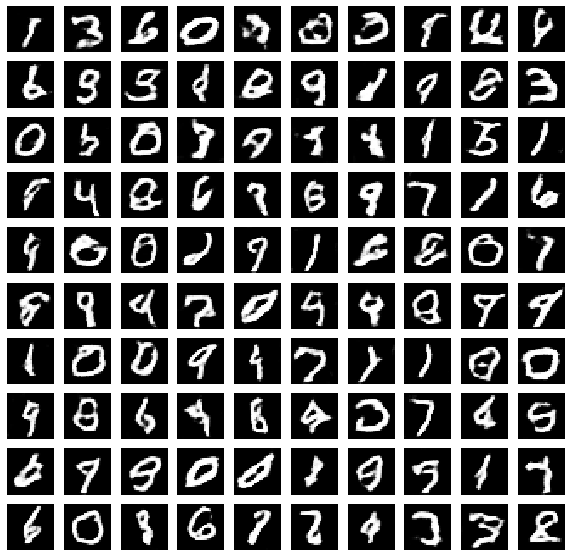

Time for epoch 30 is 9.516643762588501 sec


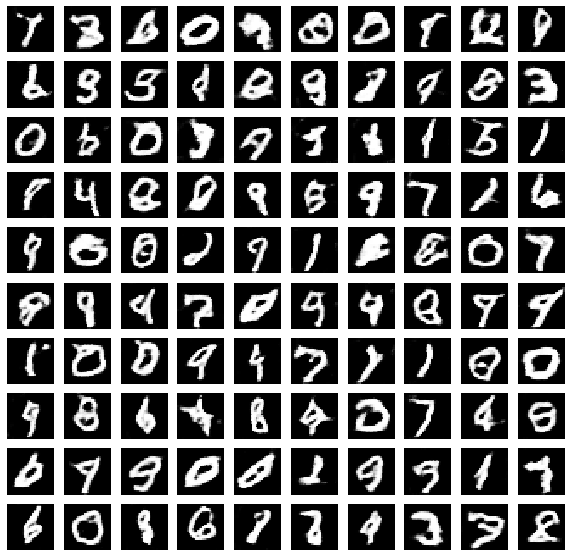

Time for epoch 31 is 9.3949875831604 sec


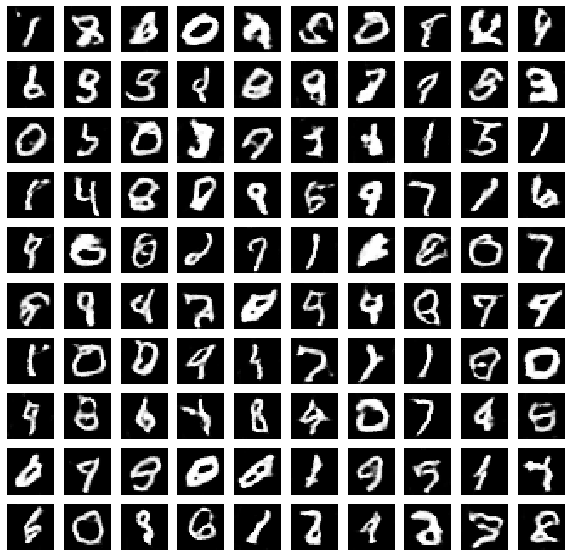

Time for epoch 32 is 9.55238652229309 sec


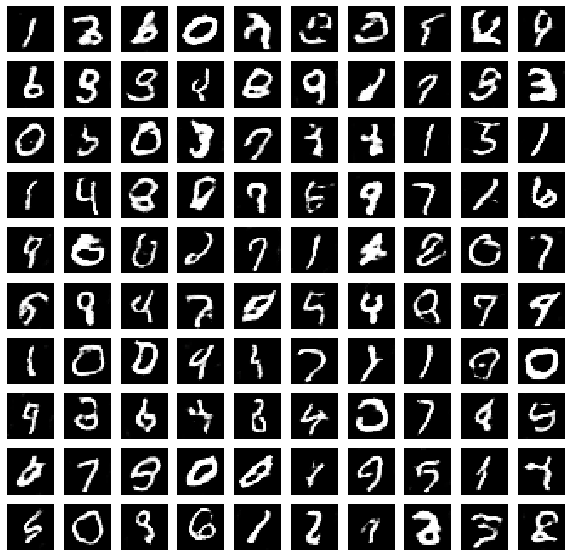

Time for epoch 33 is 9.430790662765503 sec


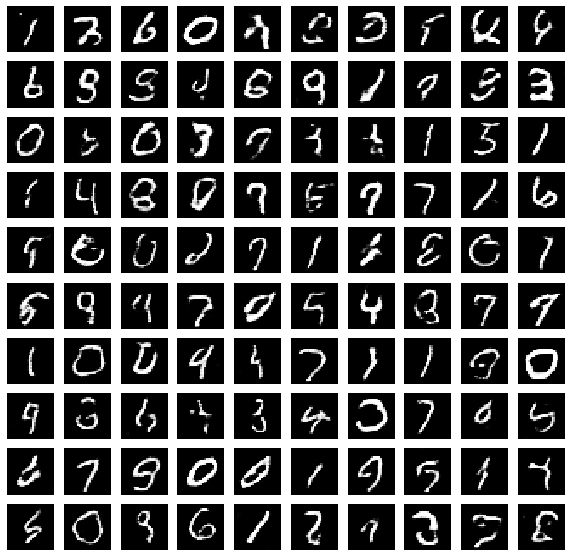

Time for epoch 34 is 9.51001763343811 sec


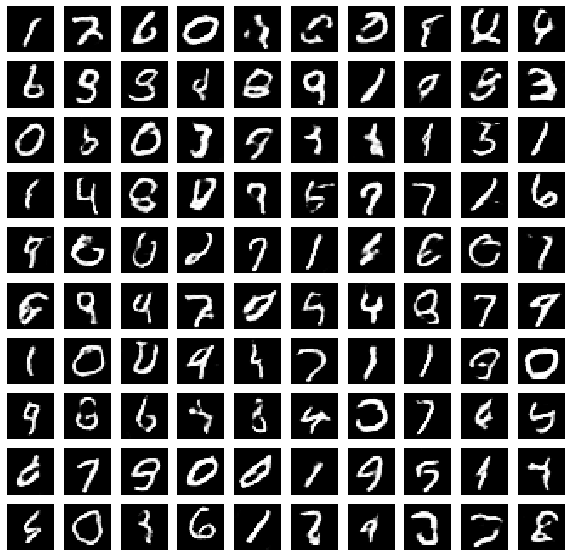

Time for epoch 35 is 9.392288446426392 sec


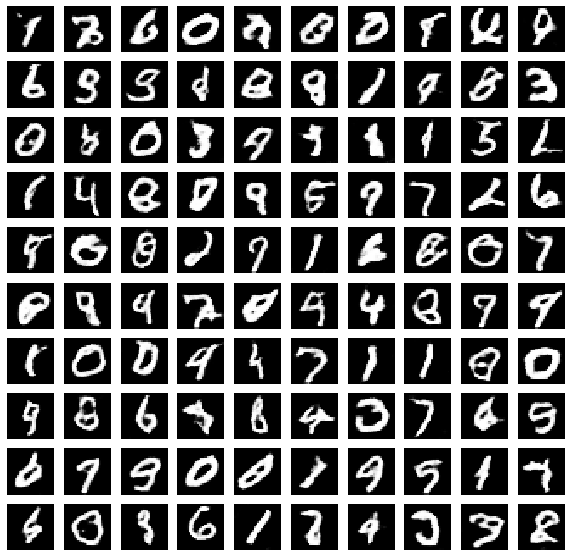

Time for epoch 36 is 9.551589250564575 sec


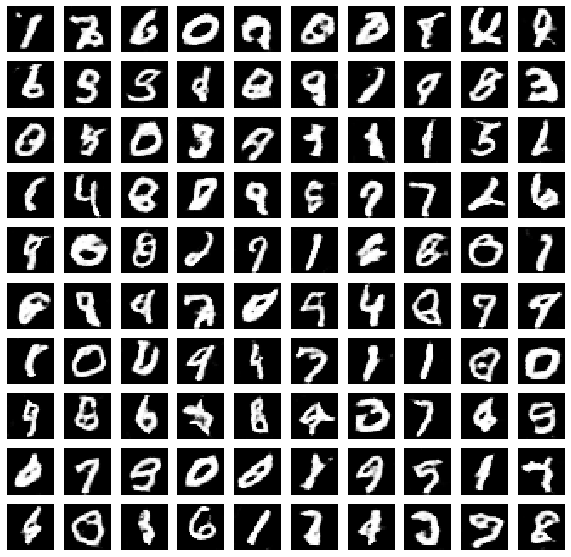

Time for epoch 37 is 9.439857006072998 sec


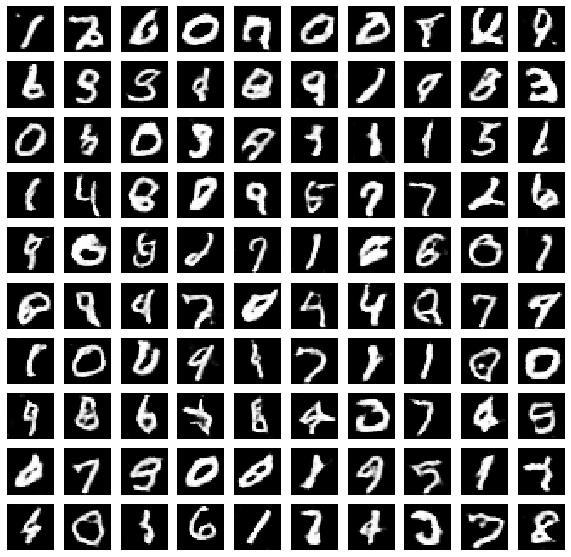

Time for epoch 38 is 9.487120389938354 sec


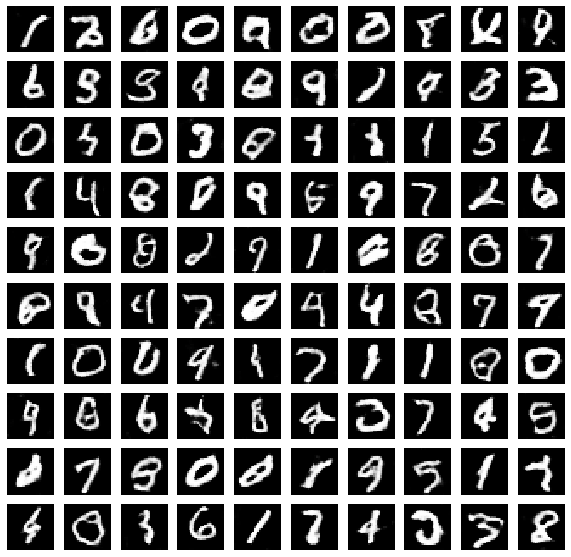

Time for epoch 39 is 9.359191179275513 sec


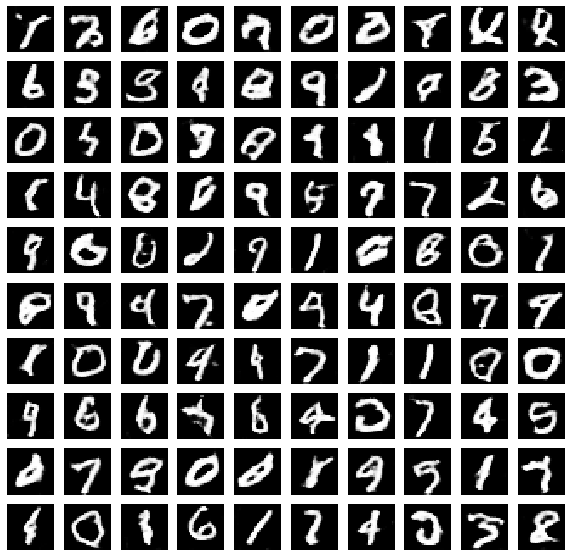

Time for epoch 40 is 9.548930168151855 sec


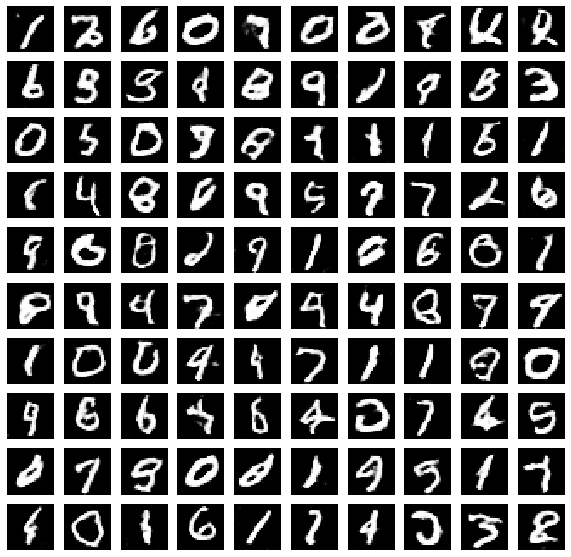

Time for epoch 41 is 9.360190391540527 sec


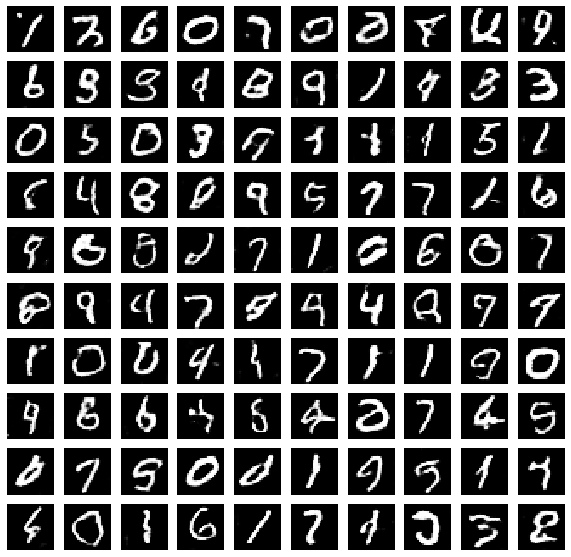

Time for epoch 42 is 9.50505781173706 sec


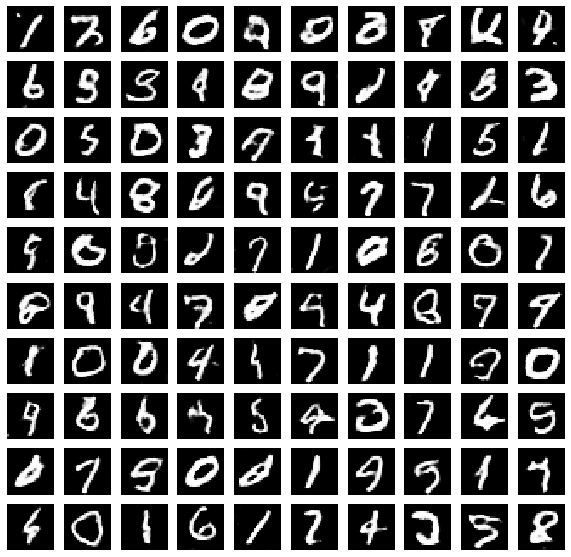

Time for epoch 43 is 9.375441312789917 sec


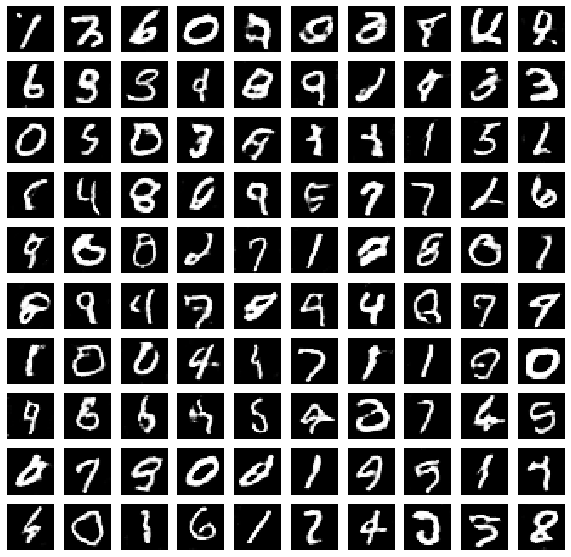

Time for epoch 44 is 9.522742986679077 sec


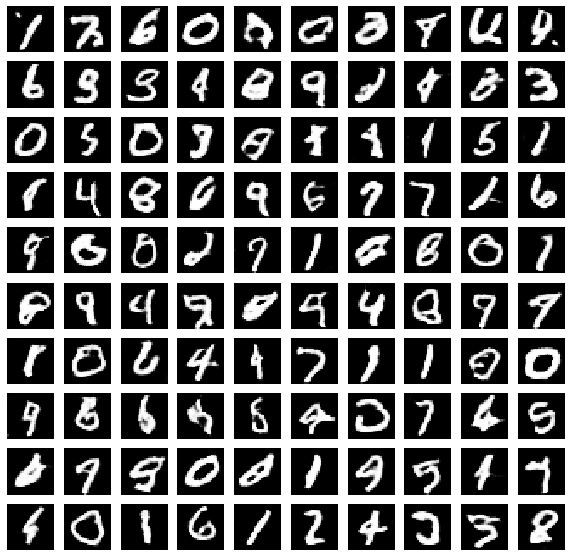

Time for epoch 45 is 9.360649108886719 sec


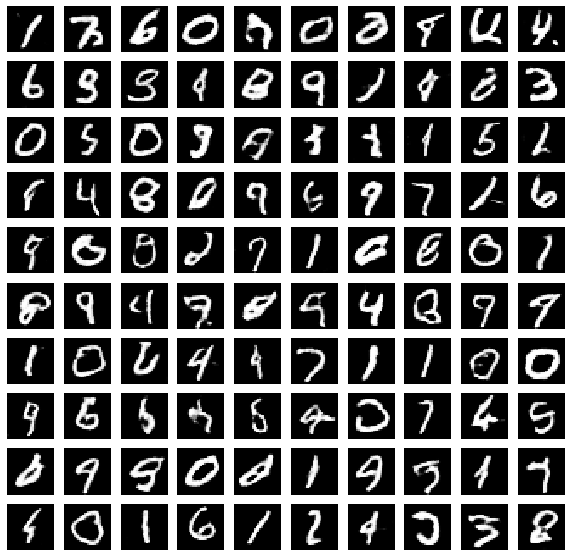

Time for epoch 46 is 9.49636435508728 sec


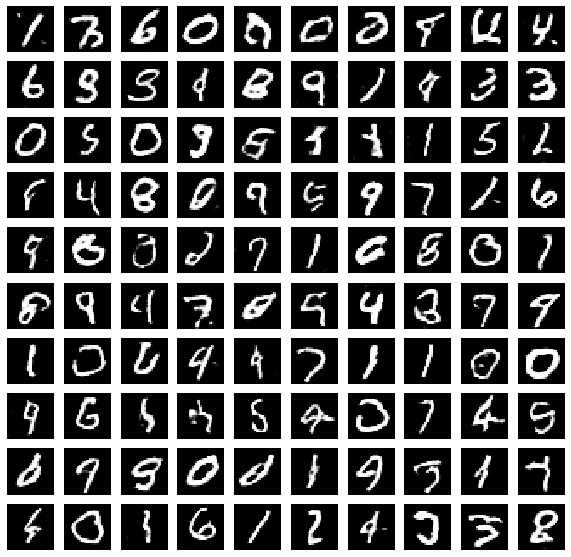

Time for epoch 47 is 9.384186506271362 sec


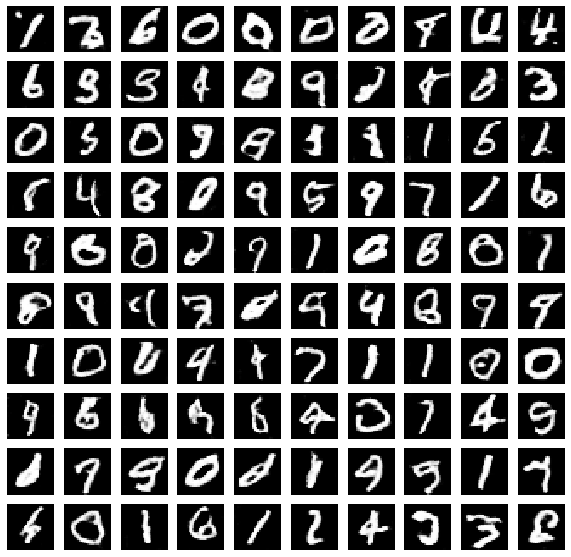

Time for epoch 48 is 9.513881206512451 sec


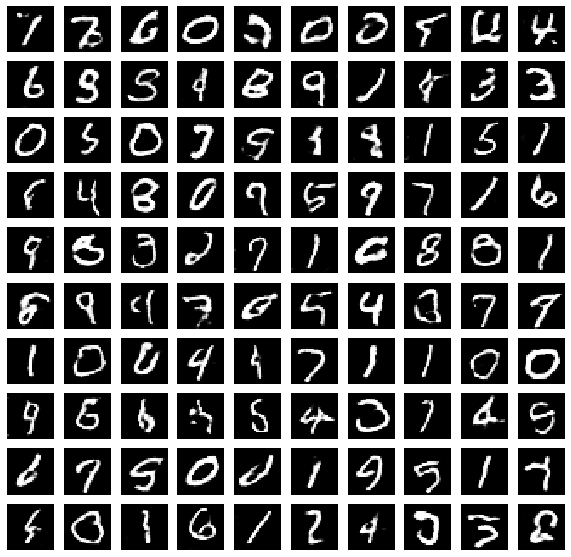

Time for epoch 49 is 9.346340417861938 sec


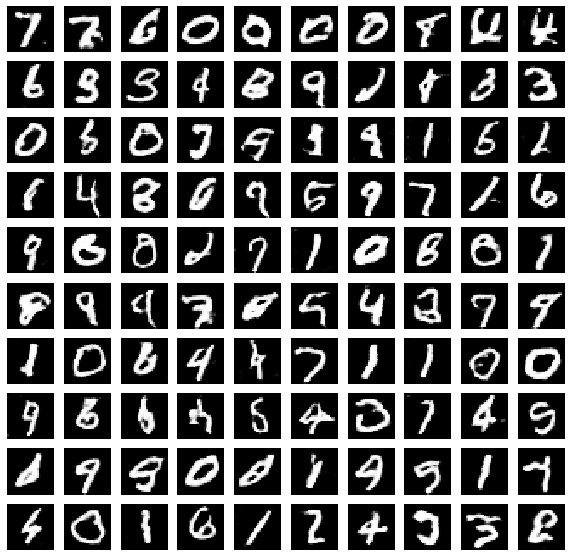

Time for epoch 50 is 9.493325471878052 sec


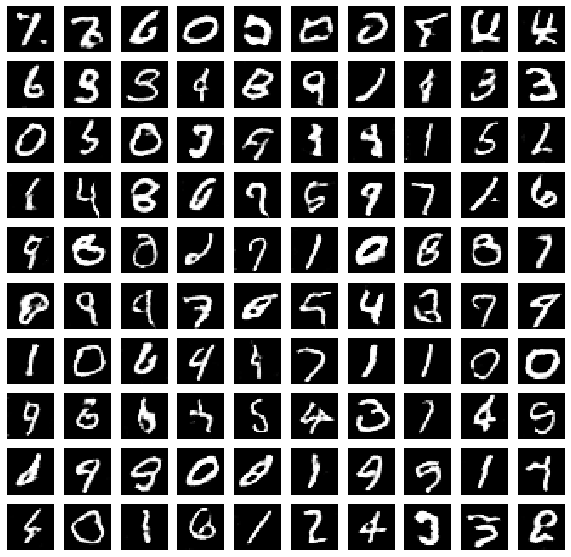

Time for epoch 51 is 9.340890884399414 sec


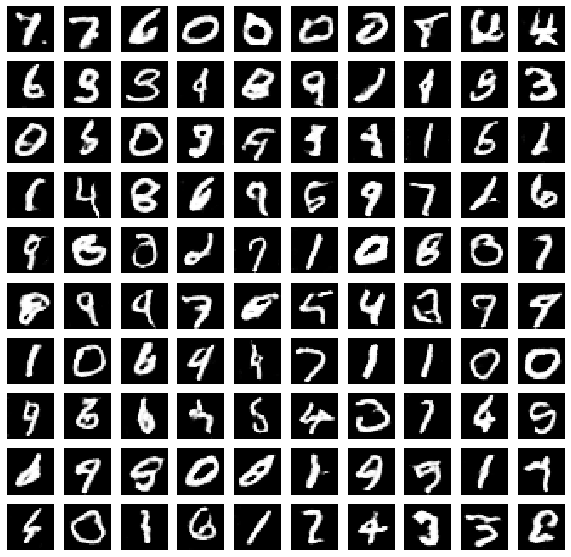

Time for epoch 52 is 9.537515878677368 sec


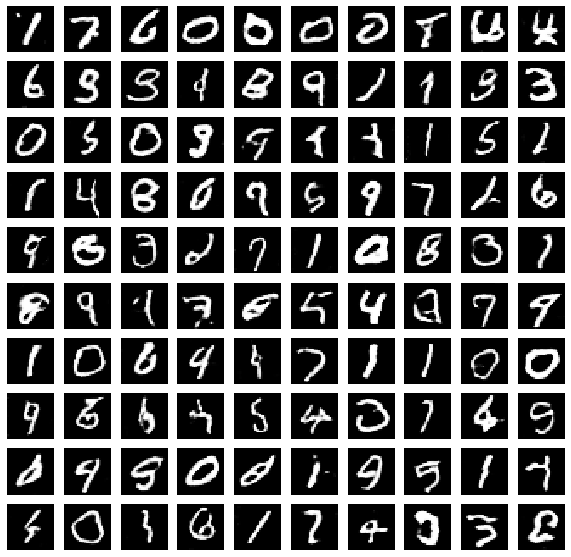

Time for epoch 53 is 9.353520631790161 sec


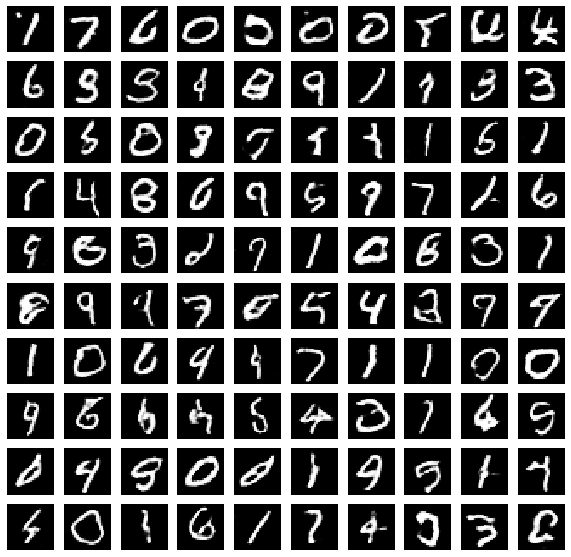

Time for epoch 54 is 9.502403974533081 sec


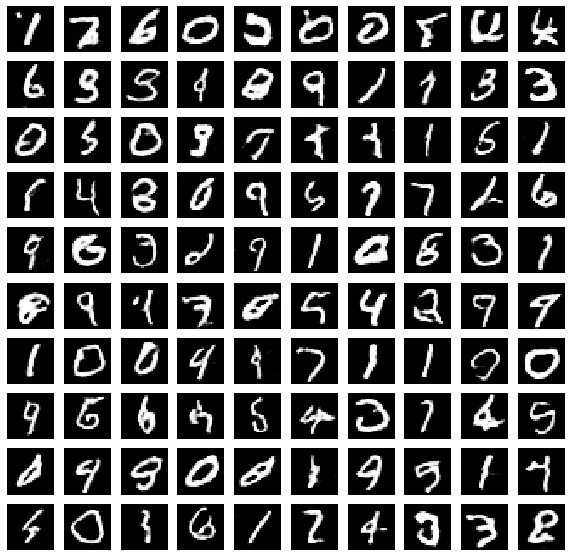

Time for epoch 55 is 9.398090362548828 sec


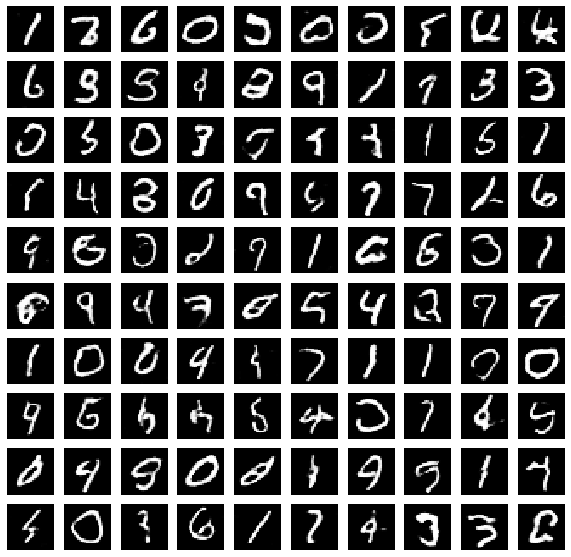

Time for epoch 56 is 9.538453340530396 sec


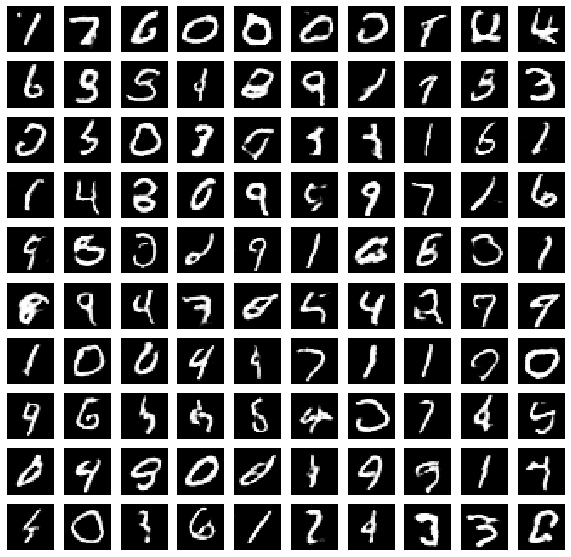

Time for epoch 57 is 9.393477439880371 sec


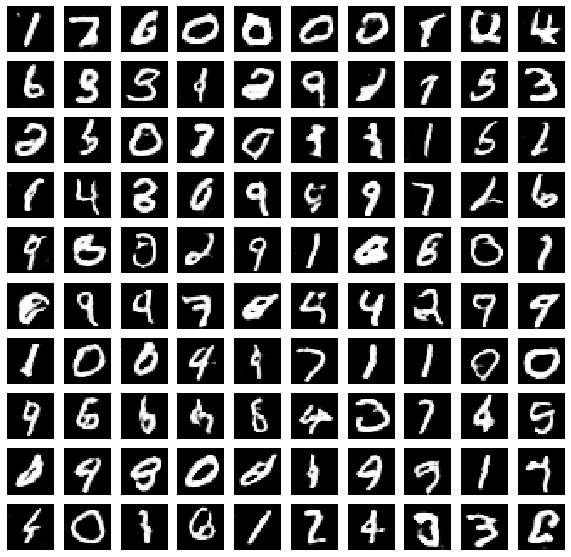

Time for epoch 58 is 9.448506832122803 sec


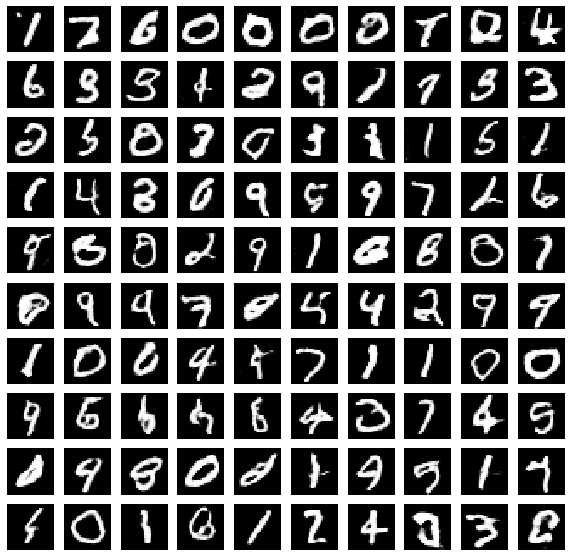

Time for epoch 59 is 9.35646677017212 sec


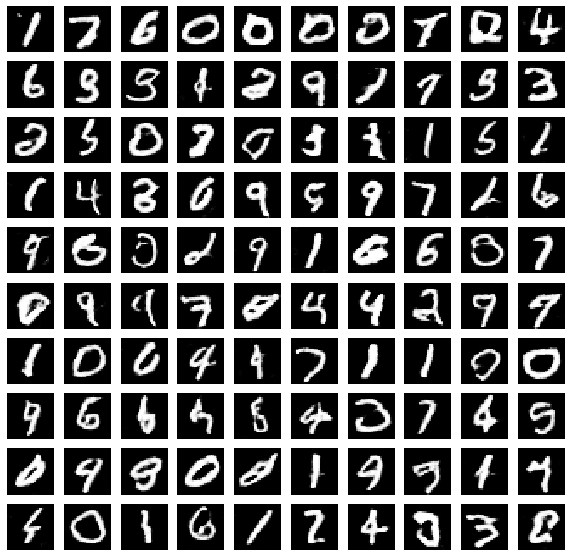

Time for epoch 60 is 9.485158920288086 sec


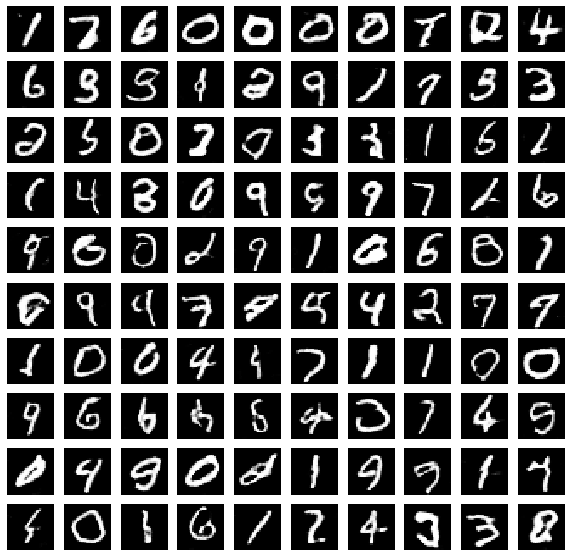

Time for epoch 61 is 9.329931259155273 sec


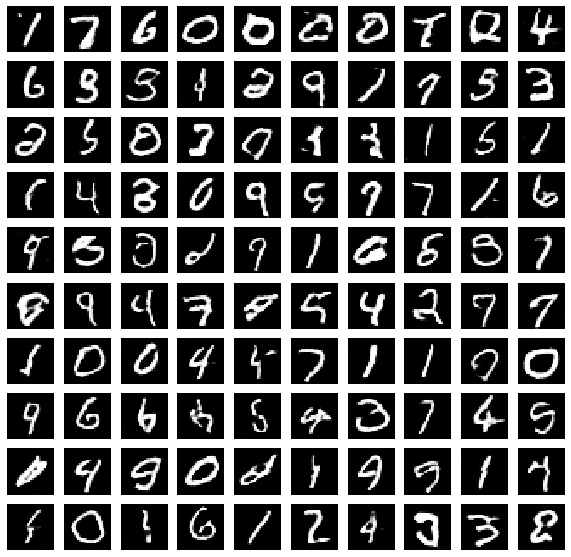

Time for epoch 62 is 9.479365348815918 sec


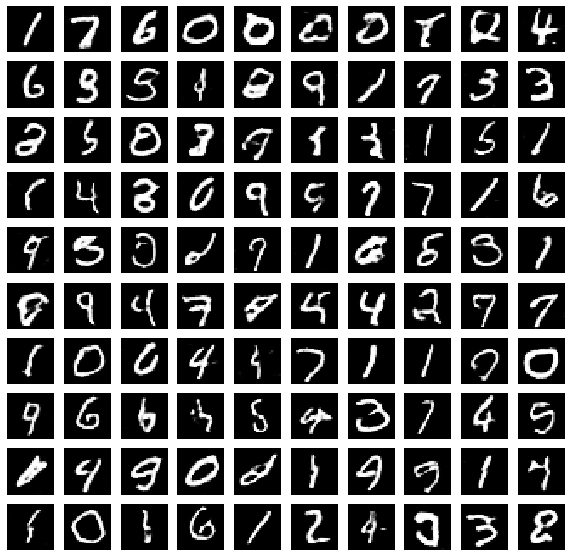

Time for epoch 63 is 9.316053867340088 sec


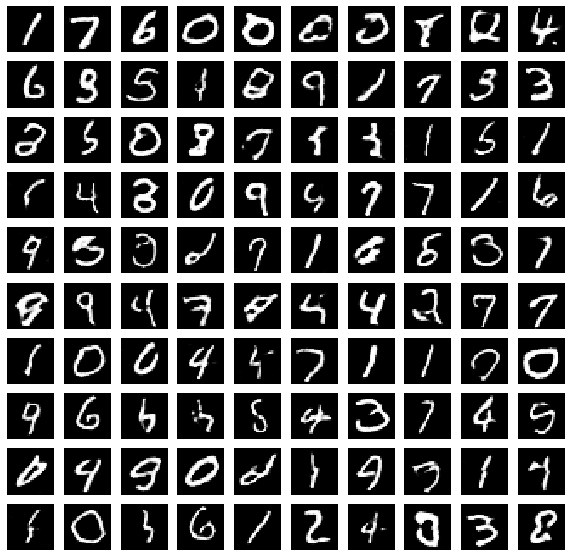

Time for epoch 64 is 9.474547147750854 sec


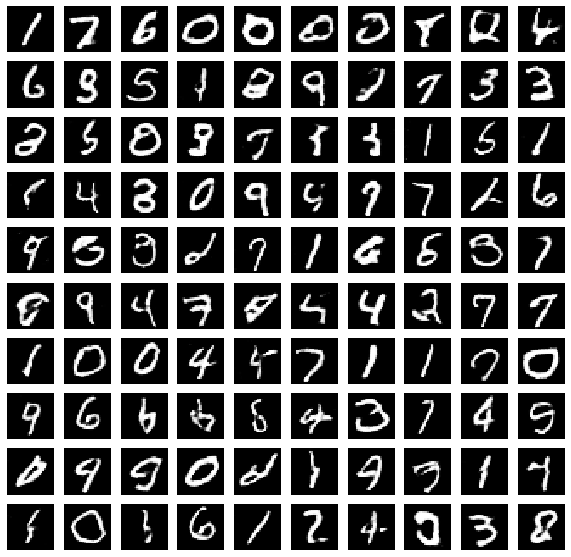

Time for epoch 65 is 9.30795431137085 sec


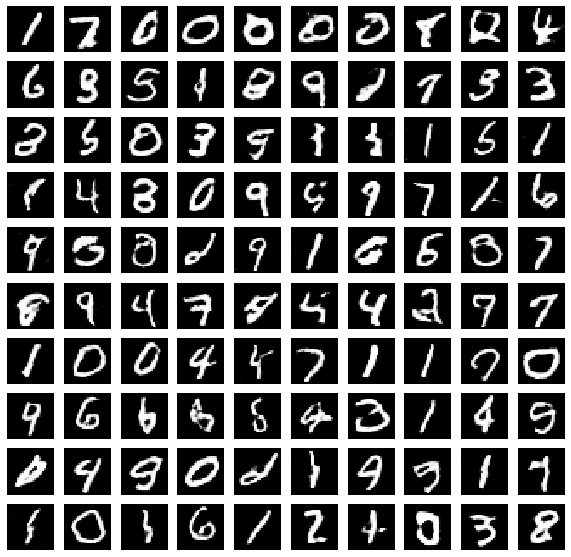

Time for epoch 66 is 9.442024946212769 sec


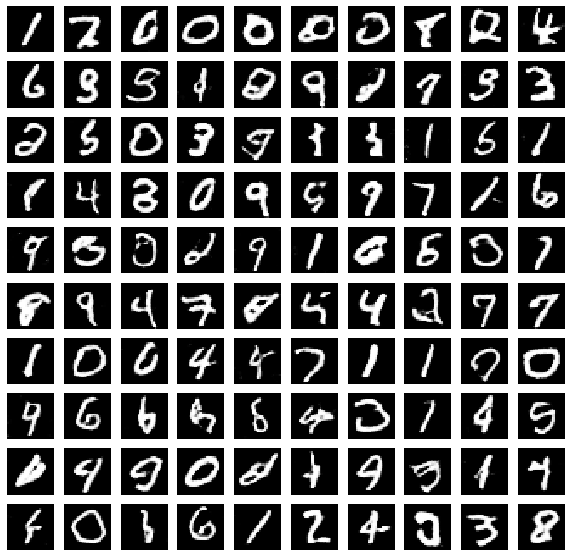

Time for epoch 67 is 9.416627883911133 sec


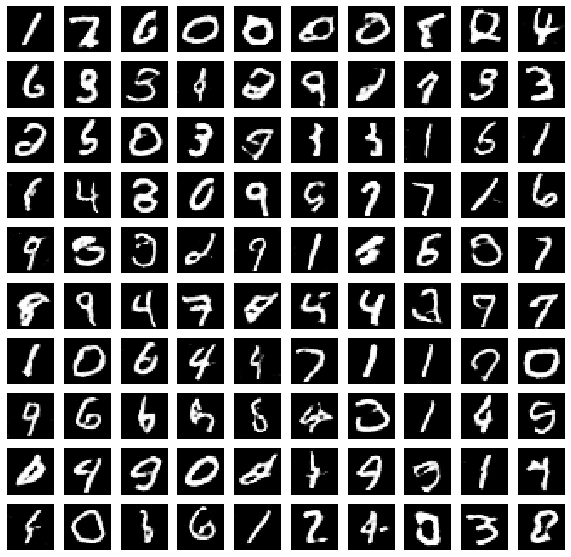

Time for epoch 68 is 9.488107681274414 sec


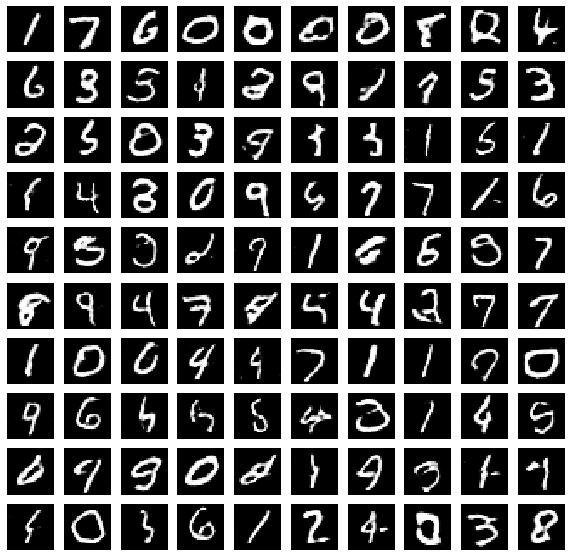

Time for epoch 69 is 9.334434986114502 sec


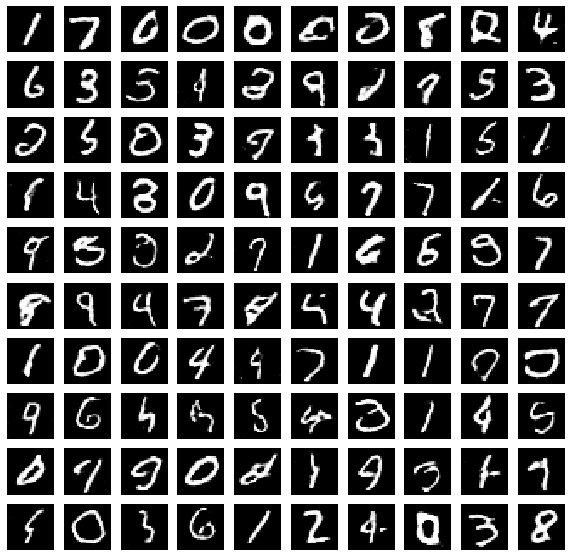

Time for epoch 70 is 9.482369184494019 sec


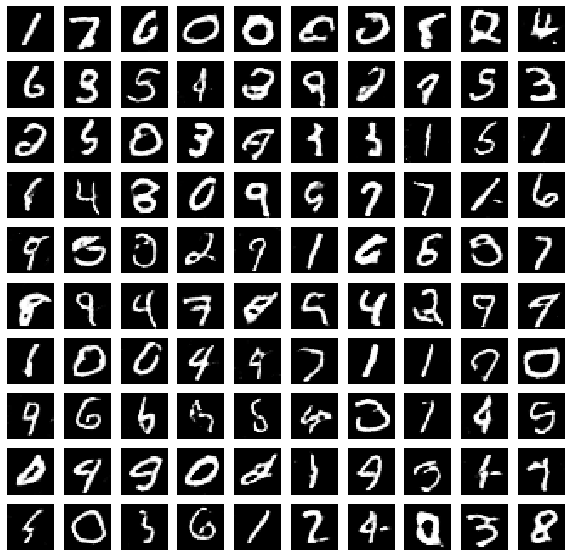

Time for epoch 71 is 9.356913089752197 sec


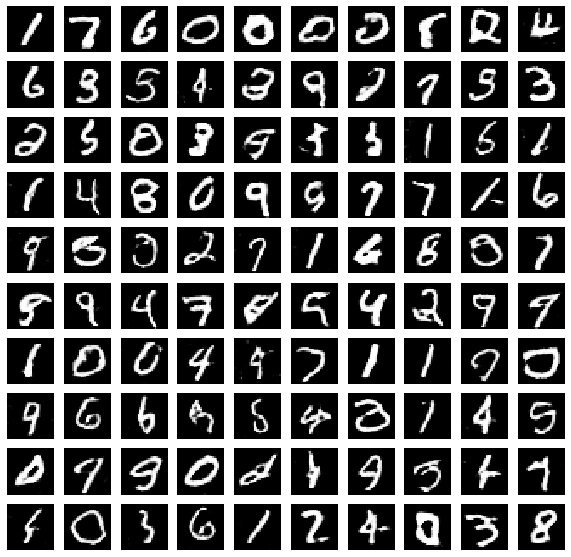

Time for epoch 72 is 9.462928533554077 sec


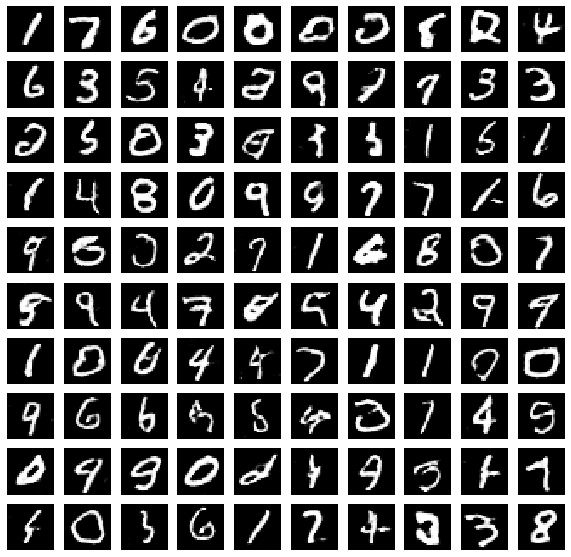

Time for epoch 73 is 9.319678783416748 sec


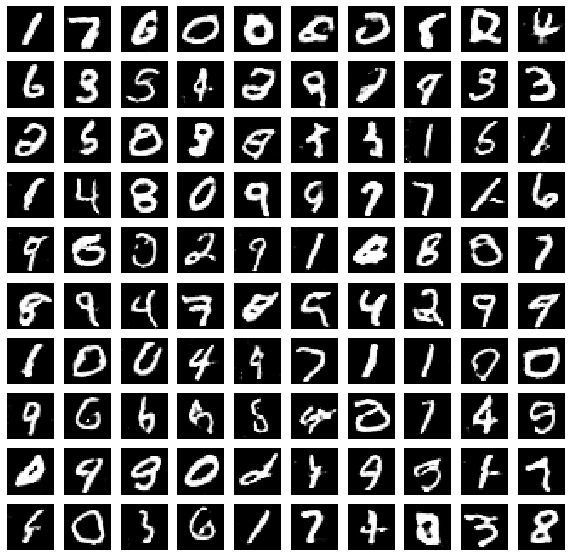

Time for epoch 74 is 9.447294473648071 sec


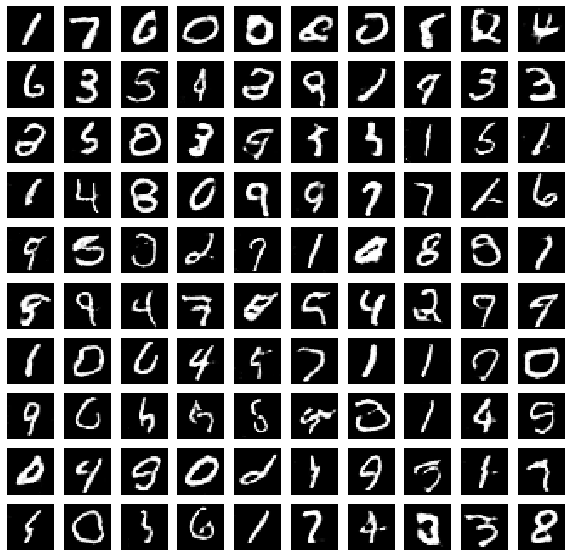

Time for epoch 75 is 9.353417158126831 sec


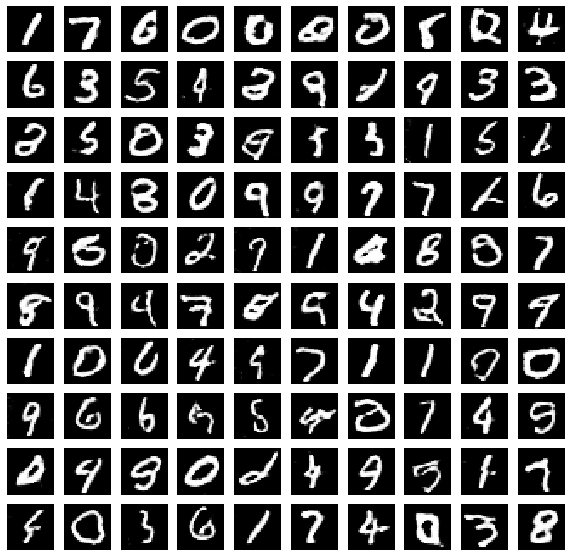

Time for epoch 76 is 9.434308290481567 sec


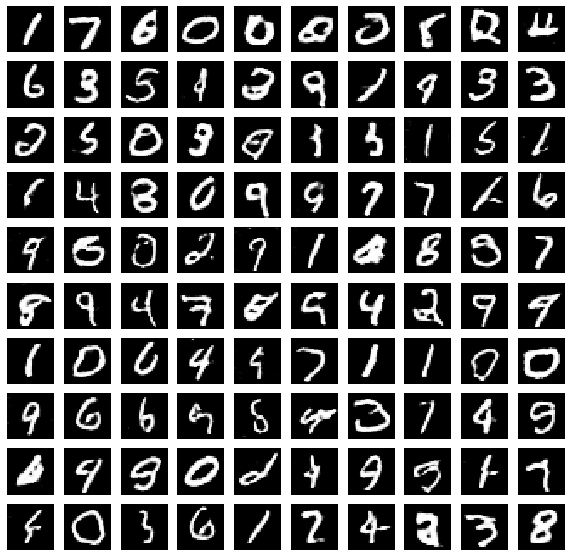

Time for epoch 77 is 9.352705478668213 sec


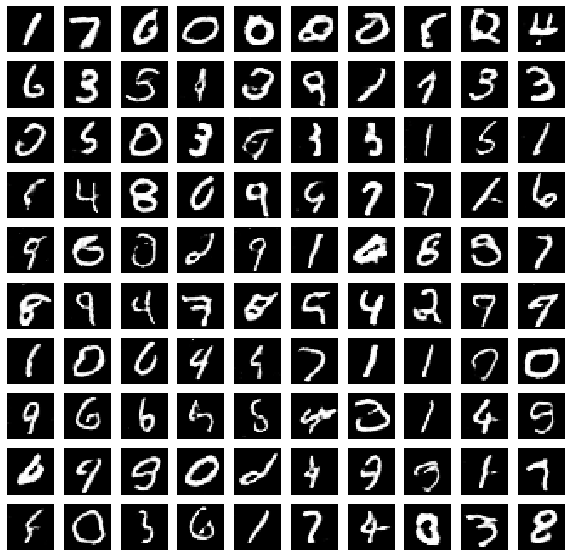

Time for epoch 78 is 9.46582841873169 sec


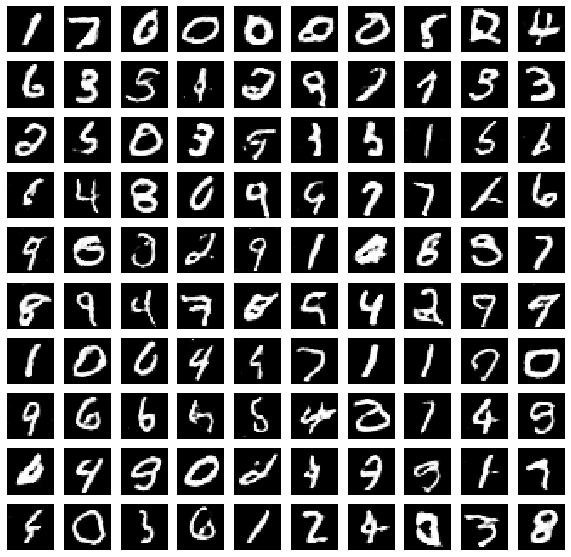

Time for epoch 79 is 9.30701994895935 sec


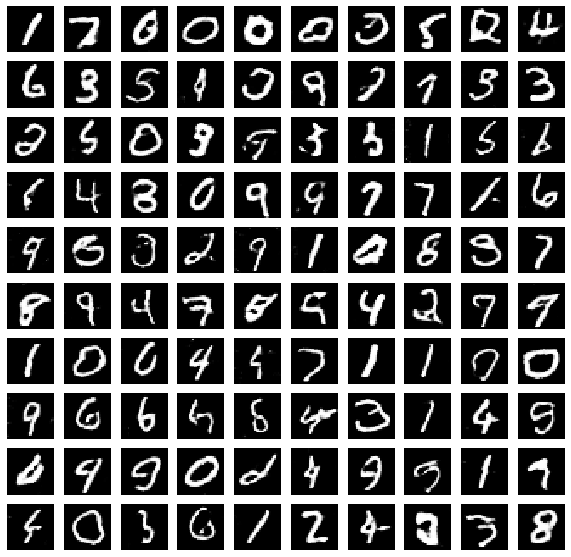

Time for epoch 80 is 9.432560205459595 sec


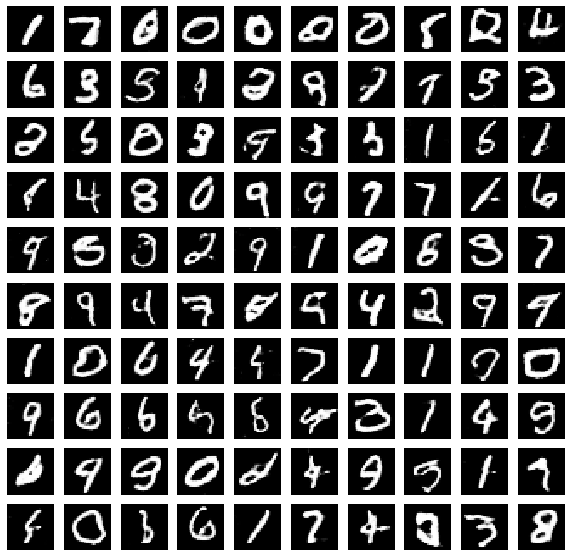

Time for epoch 81 is 9.35130000114441 sec


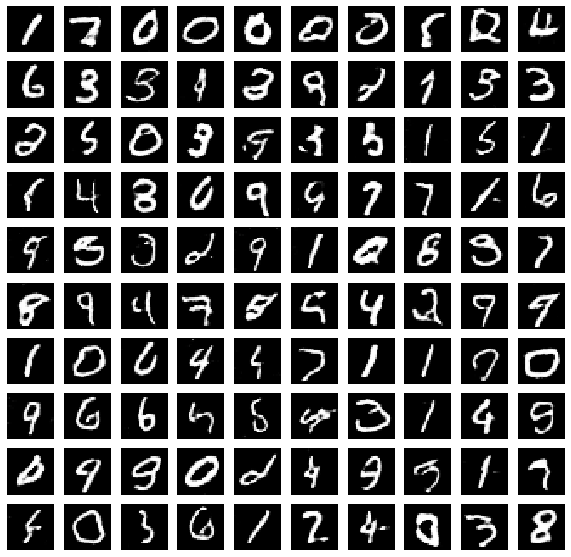

Time for epoch 82 is 9.449025869369507 sec


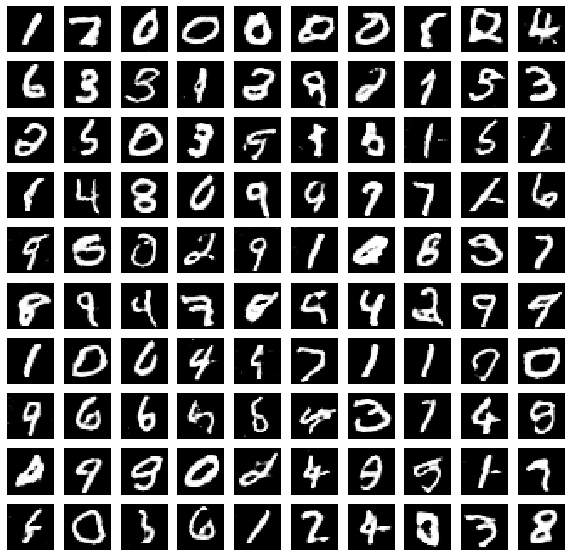

Time for epoch 83 is 9.366861581802368 sec


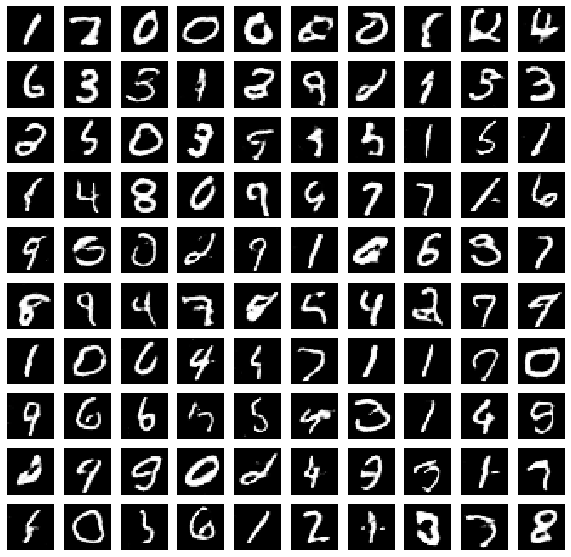

Time for epoch 84 is 9.446938514709473 sec


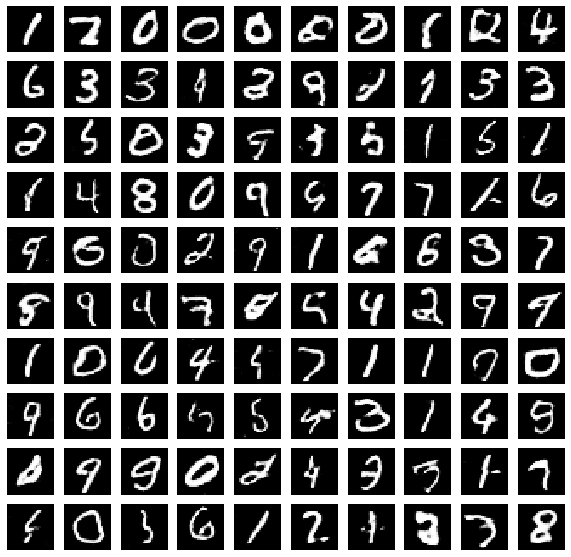

Time for epoch 85 is 9.334556579589844 sec


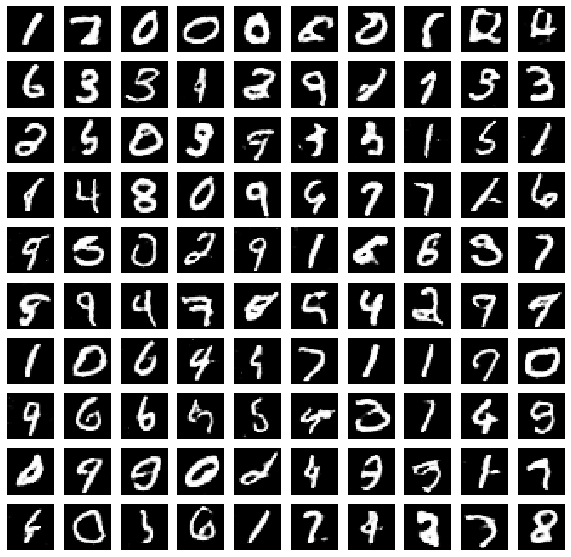

Time for epoch 86 is 9.482473134994507 sec


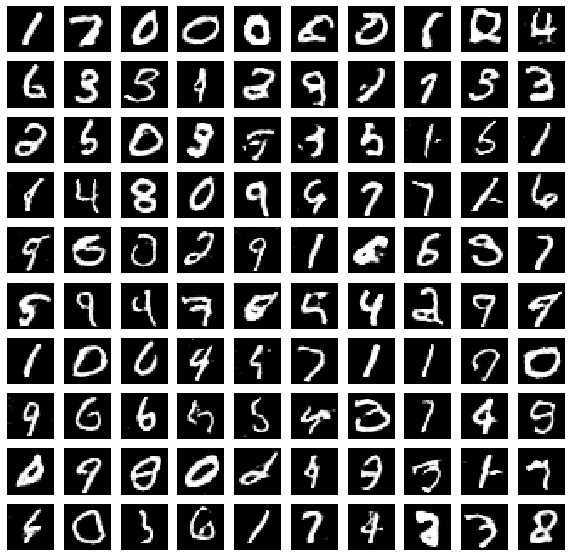

Time for epoch 87 is 9.421027660369873 sec


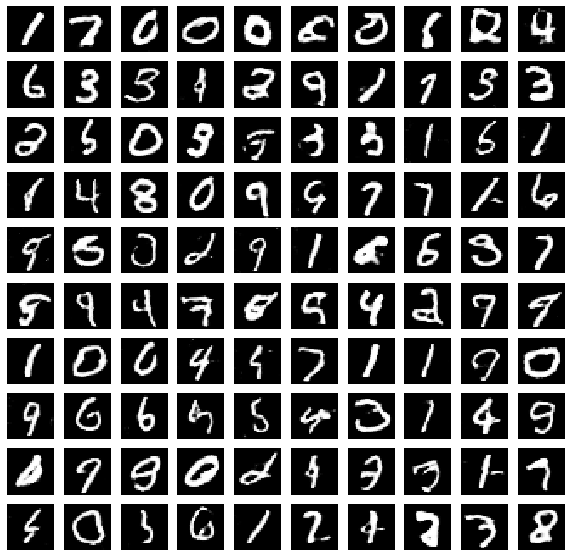

Time for epoch 88 is 9.422057151794434 sec


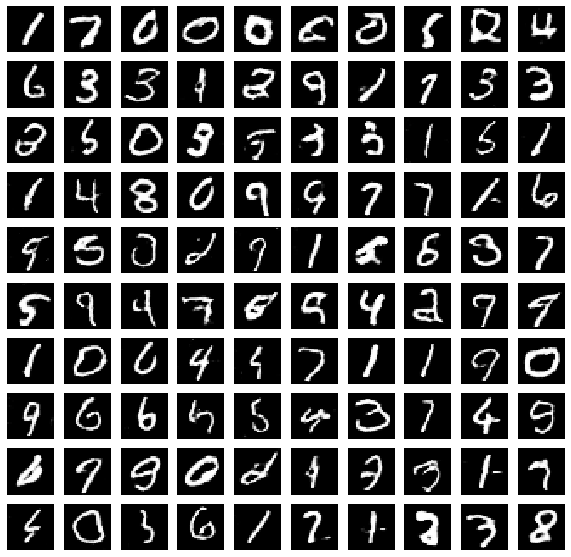

Time for epoch 89 is 9.35831904411316 sec


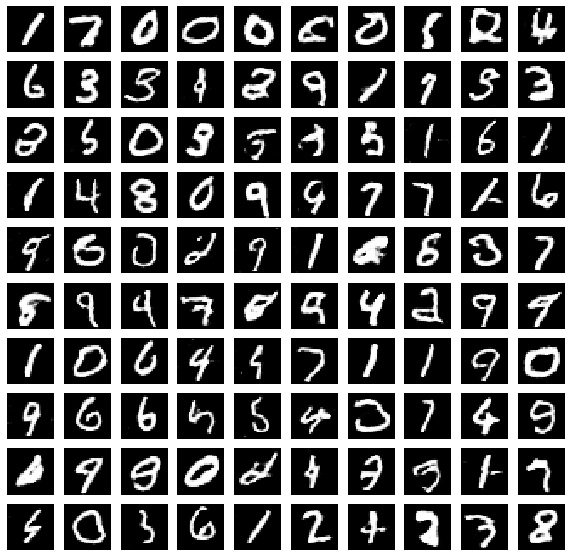

Time for epoch 90 is 9.448561906814575 sec


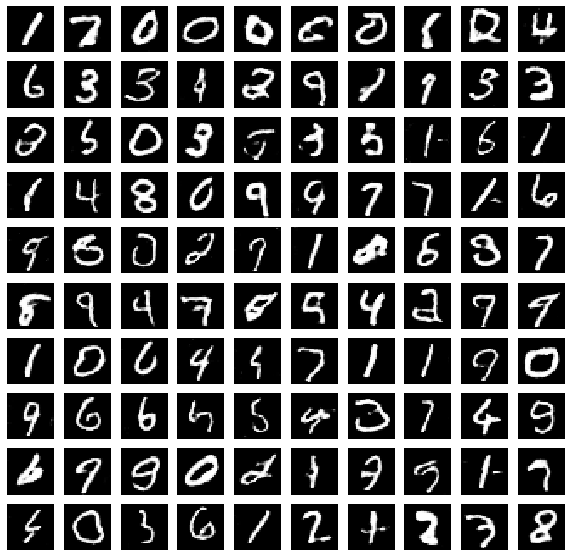

Time for epoch 91 is 9.322558879852295 sec


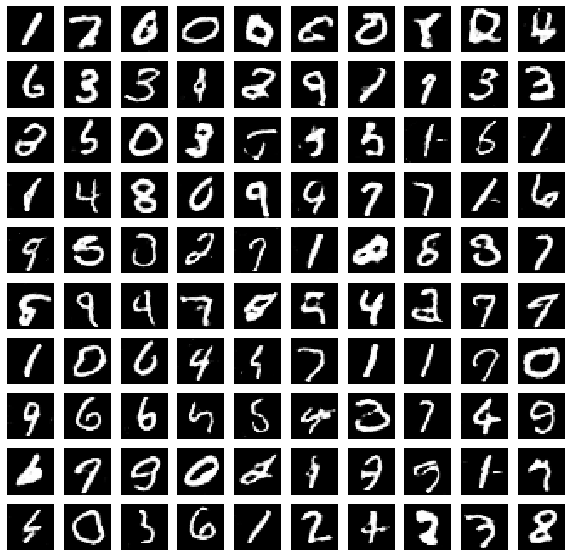

Time for epoch 92 is 9.431270599365234 sec


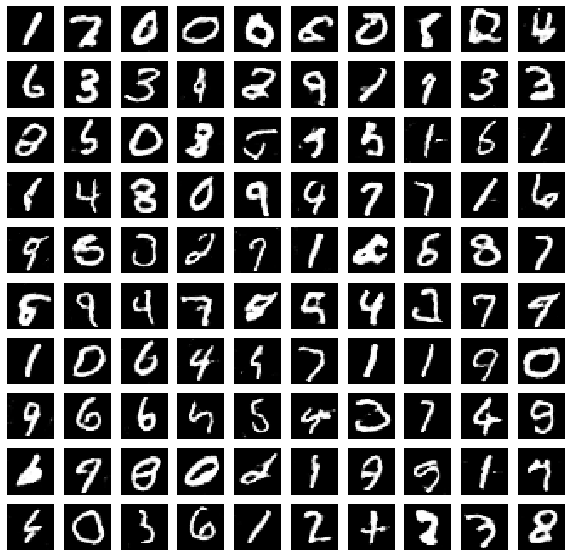

Time for epoch 93 is 9.312048435211182 sec


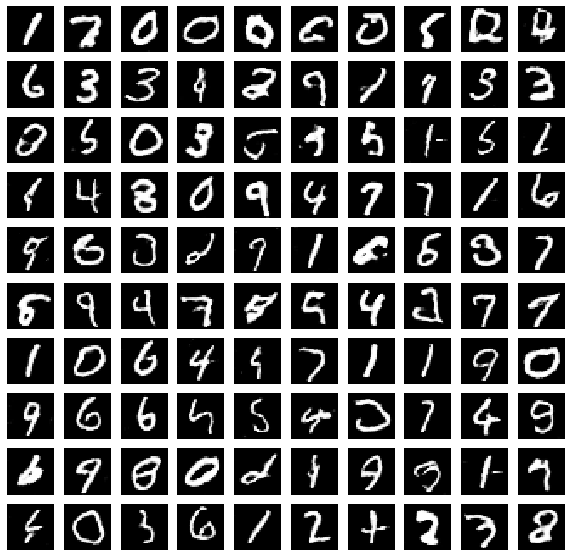

Time for epoch 94 is 9.560541152954102 sec


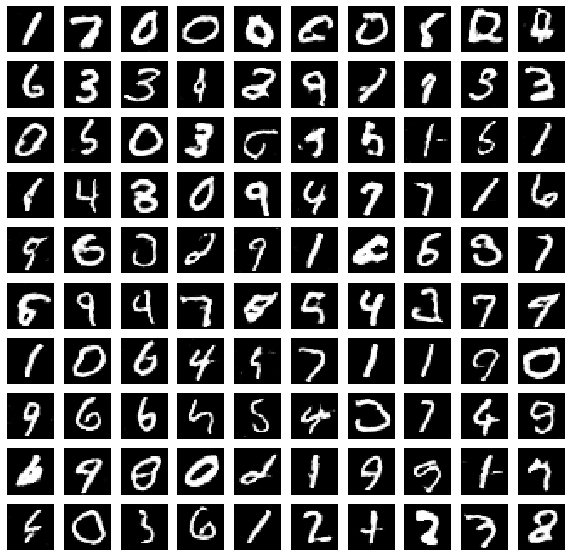

Time for epoch 95 is 9.340264320373535 sec


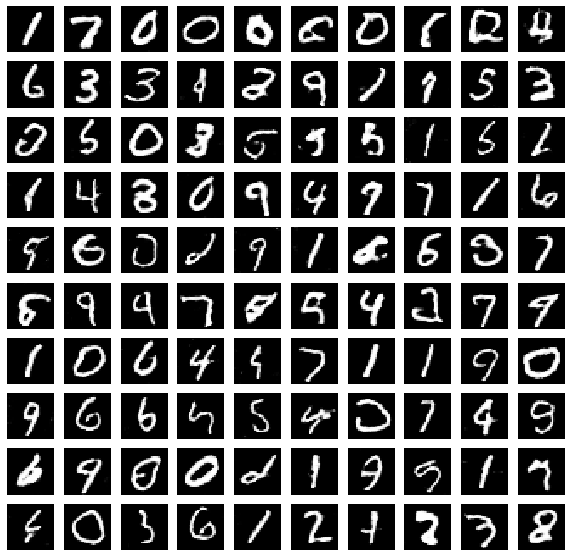

Time for epoch 96 is 9.530032873153687 sec


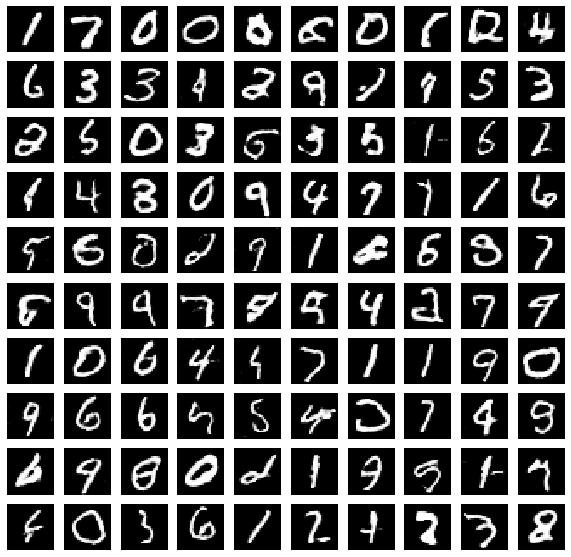

Time for epoch 97 is 9.480273485183716 sec


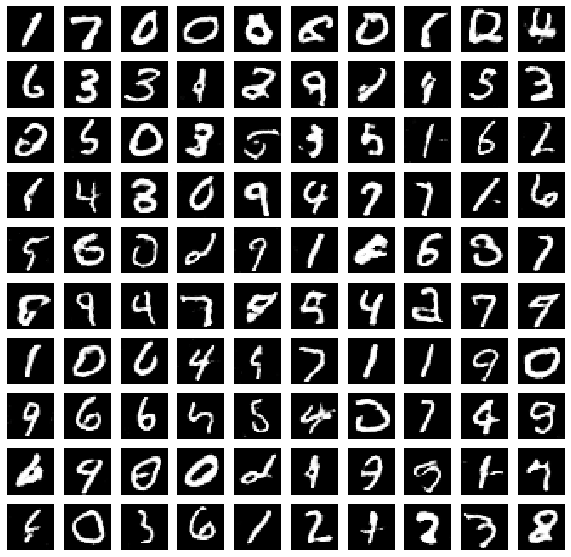

Time for epoch 98 is 9.583067178726196 sec


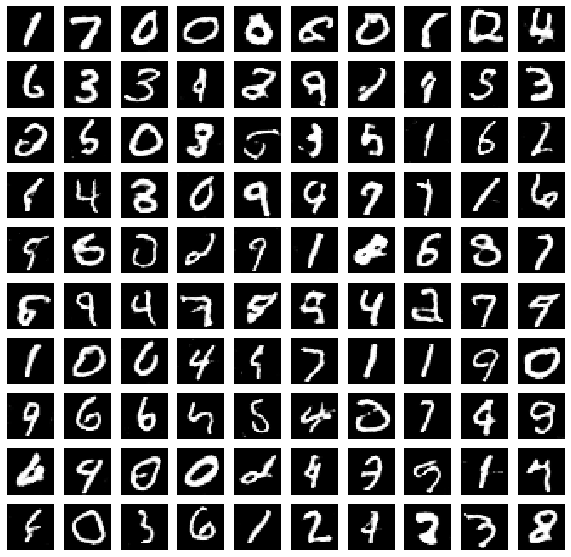

Time for epoch 99 is 9.427118062973022 sec


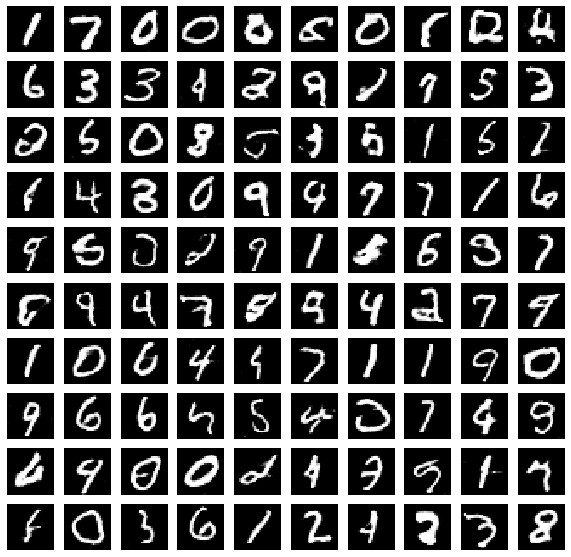

Time for epoch 100 is 9.54751443862915 sec


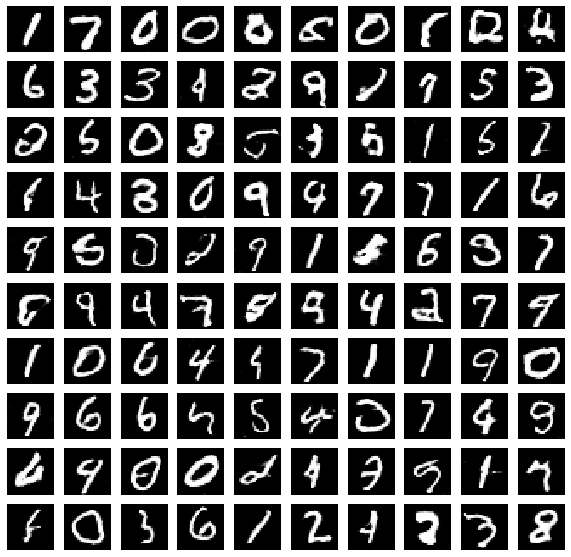

In [18]:
EPOCHS = 100
train(train_dataset, EPOCHS)